# Task - EDA, Analysing missing values, filling missing values

### Importing Libraries and settings

In [2]:
# For data cleaning and EDA
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import random as rnd
import plotly.express as px 
import datetime

# To print multiple outputs in a single cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Plot settings
sns.set(rc={"figure.dpi":100, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")
from IPython.display import set_matplotlib_formats
# set_matplotlib_formats('retina')
%config InlineBackend.figure_format = 'retina'
plt.style.use('tableau-colorblind10')

# Set default font sizes
import matplotlib as mpl
mpl.rcParams['axes.titlesize'] = 20 # Title
mpl.rcParams['axes.titleweight'] = 'bold' # Make title bold 
mpl.rcParams['axes.labelsize'] = 16 # X-Axis & Y-Axis
mpl.rcParams['axes.labelweight'] = 'bold' # Make labels bold
mpl.rcParams['xtick.labelsize'] = 14 # X-ticks
mpl.rcParams['ytick.labelsize'] = 14 # Y-ticks

# Use Plotly color palette
plotly_color_scale = px.colors.qualitative.Plotly
custom_colors = plotly_color_scale

### **Note**
- The dataframe ***"df_combined"*** has data from 2020 to 2023.
-  We also had data from 2015-2020 as a separate file from another source, which had AQI calculated already.
- The dataframe ***"df_combined"*** dataset is merged into 2015-2020 data by Rudra Chatterjee (team member in this Omdena project) and we finally have the merged data from 2015 to 2023.
- The dataset name is ***"Gurugram_Hourly_Compiled.csv"***

# 1.Basic Exploratory Data Analysis

In [3]:
df = pd.read_csv('../../data/preprocessing_data/Gurugram_Hourly_Compiled.csv')
df

/var/folders/27/b03t8q596qvcmtyqjtnh0w6w0000gn/T/ipykernel_5368/3033016460.py:1: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,25,26,27,30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../../data/preprocessing_data/Gurugram_Hourly_Compiled.csv')


,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
0,04-03-2020 00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.5,3.01,5.08,2.04,...,3.1,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,04-03-2020 01:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,2,...,3.03,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,04-03-2020 02:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.6,1.85,12.72,2.02,...,3.08,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,04-03-2020 03:00,Vikas Sadan,67.6,377.93,29.18,317.53,10.53,1.31,11.46,1.96,...,3.02,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,04-03-2020 04:00,Vikas Sadan,72.72,319.8,33.66,273.25,9.98,0.63,4.76,2.01,...,2.97,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147526,2020-06-30 20:00:00,NaN,54.74,6.23,10.67,12.6,4.18,0.6,NaN,2.14,...,4.7,NaN,NaN,NaN,135.42,2.95,NaN,70.95,154.0,Moderate
147527,2020-06-30 21:00:00,NaN,54.37,6.3,10.28,11.88,4.03,1.2,NaN,1.87,...,4.29,NaN,NaN,NaN,136.11,3.47,NaN,55.13,154.0,Moderate
147528,2020-06-30 22:00:00,NaN,50.34,6.93,10.36,13.01,6.17,1.0,NaN,2.41,...,4.59,NaN,NaN,NaN,147.32,3.76,NaN,42.60,155.0,Moderate
147529,2020-06-30 23:00:00,NaN,53.23,6.64,10.3,12.75,6.31,0.86,NaN,2.54,...,4.61,NaN,NaN,NaN,163.15,3.36,NaN,35.61,156.0,Moderate


#### Observations
- We have a hourly time series data from 2015 to 26th March 2023.
- We can see many NaNs at the first glance.
- **Station** is a categorical column with 4 values but has NaNs.
- **AQI_Bucket** is a categorical column.
- Need to correct the datetime dtype.
- Remaining other columns are all **numeric**
- There are no unique columns.

### 1.1 Looking into the dataset

In [4]:
df.head(5)

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
0,04-03-2020 00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.5,3.01,5.08,2.04,...,3.1,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,04-03-2020 01:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,2,...,3.03,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,04-03-2020 02:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.6,1.85,12.72,2.02,...,3.08,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,04-03-2020 03:00,Vikas Sadan,67.6,377.93,29.18,317.53,10.53,1.31,11.46,1.96,...,3.02,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,04-03-2020 04:00,Vikas Sadan,72.72,319.8,33.66,273.25,9.98,0.63,4.76,2.01,...,2.97,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df.tail(5)

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
147526,2020-06-30 20:00:00,NaN,54.74,6.23,10.67,12.6,4.18,0.6,NaN,2.14,...,4.7,NaN,NaN,NaN,135.42,2.95,NaN,70.95,154.0,Moderate
147527,2020-06-30 21:00:00,NaN,54.37,6.3,10.28,11.88,4.03,1.2,NaN,1.87,...,4.29,NaN,NaN,NaN,136.11,3.47,NaN,55.13,154.0,Moderate
147528,2020-06-30 22:00:00,NaN,50.34,6.93,10.36,13.01,6.17,1.0,NaN,2.41,...,4.59,NaN,NaN,NaN,147.32,3.76,NaN,42.60,155.0,Moderate
147529,2020-06-30 23:00:00,NaN,53.23,6.64,10.3,12.75,6.31,0.86,NaN,2.54,...,4.61,NaN,NaN,NaN,163.15,3.36,NaN,35.61,156.0,Moderate
147530,2020-07-01 00:00:00,NaN,61.64,5.99,10.58,12.37,7.57,1.11,NaN,2.67,...,4.73,NaN,NaN,NaN,174.08,2.91,NaN,44.14,157.0,Moderate


In [6]:
df.sample(5)

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
61737,04-02-2021 08:00,NISE,195.93,7.02,16.11,23.13,NaN,0.85,31.49,NaN,...,NaN,NaN,None,0.0,266.21,NaN,None,NaN,NaN,NaN
40627,30-09-2021 11:00,Sector 51,43.89,5.15,7.65,5.72,1.85,1.36,45.81,None,...,None,31.72,0,0.0,73.62,58.61,NaN,NaN,NaN,NaN
33415,03-12-2020 23:00,Sector 51,270.5,105.76,72.02,0,3.36,4.18,0.03,31.03,...,1.33,14.84,0,0.0,529.2,204.21,NaN,NaN,NaN,NaN
92279,09-07-2021 14:00,Teri Gram,37.75,8.04,9.95,22.12,3.06,0.43,21.14,3.05,...,2.35,36.19,None,0.0,76.8,30.19,NaN,NaN,NaN,NaN
140649,2019-09-18 07:00:00,NaN,43.32,5.65,5.74,10.96,9.67,1.59,NaN,2.1,...,NaN,NaN,NaN,NaN,87.96,NaN,NaN,19.32,92.0,Satisfactory


### 1.2 Checking the datatypes

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147531 entries, 0 to 147530
Data columns (total 31 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Datetime     147531 non-null  object 
 1   Station      107273 non-null  object 
 2   PM2.5        141387 non-null  object 
 3   NO           140785 non-null  object 
 4   NO2          141476 non-null  object 
 5   NOx          134829 non-null  object 
 6   SO2          112070 non-null  object 
 7   CO           142368 non-null  object 
 8   Ozone        107273 non-null  object 
 9   Benzene      108032 non-null  object 
 10  Toluene      104172 non-null  object 
 11  Eth-Benzene  80457 non-null   object 
 12  MP-Xylene    80457 non-null   object 
 13  O            26816 non-null   object 
 14  Temp         26816 non-null   object 
 15  RH           80457 non-null   object 
 16  WS           53641 non-null   object 
 17  WD           80457 non-null   object 
 18  SR           80457 non-n

### 1.3 Checking the Statistics

In [8]:
df.describe().T.style.bar() # Includes only numeric columns

,count,mean,std,min,25%,50%,75%,max
TOT-RF,107273.000000,0.070499,2.380372,0.000000,0.000000,0.000000,0.000000,246.810000
O3,34793.000000,34.747413,31.186317,0.010000,11.330000,23.960000,50.360000,199.800000
AQI,33420.000000,223.877409,121.771297,31.000000,119.000000,205.000000,321.000000,966.000000


#### Observations
- **TOT-RF** has a mean of 0.07, 75% is 0 and max value is 246, so majority values must be present after 75%
- **O3 & AQI** Count is very less compared to the shape of the dataset, this means there will be lots of missing values. We have to analyze them.

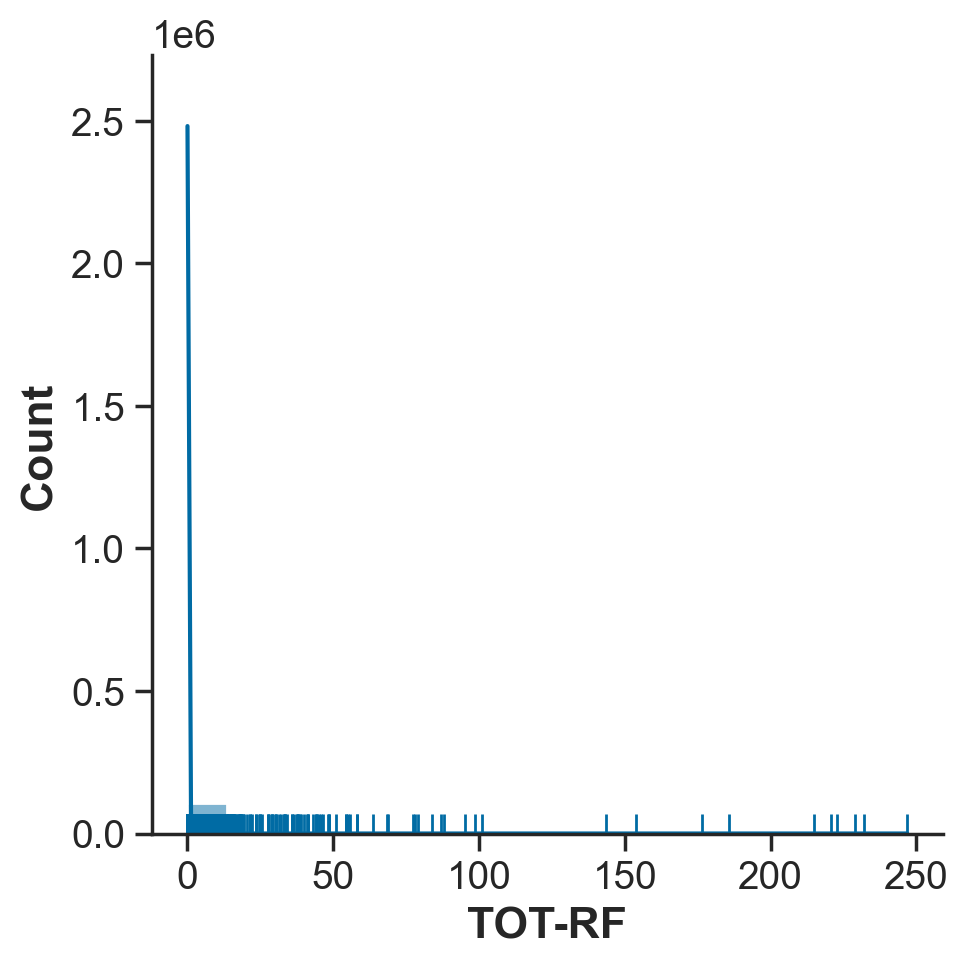

In [9]:
# Seeing the distribution of TOT-RF

sns.displot(data=df, x='TOT-RF',kde=True, rug=True) 

- #### We see very few points after 100

In [10]:
# Includes all the columns that are 'object' type

df.describe(include='object').T

,count,unique,top,freq
Datetime,147531,67083,04-03-2020 00:00,4
Station,107273,4,Sector 51,26825
PM2.5,141387,36863,None,11113
NO,140785,13883,None,10697
NO2,141476,14463,None,9863
NOx,134829,16927,None,7613
SO2,112070,7891,None,8535
CO,142368,1677,None,7541
Ozone,107273,13252,None,9341
Benzene,108032,3697,None,16015


- We can see count of each column is != shape of the dataset.
- Also in **top** column, **None** has the most frequency.
- This means there are lots of NaNs/None

In [12]:
df.describe(include='object').T.shape
df.describe(include='float').T.shape
len(df.columns)

(28, 4)

(3, 8)

31

- We can see the shape of object is 28 rows & float is 3 rows.
- So total 31 columns we have covered.

# 2. Data cleaning & Analysing Missing values

## 2.1 Finding Missing values % - Column wise

In [13]:
# Checking only NaNs, not None

for i in df.columns:
    print(i,"has",df[i].isnull().sum(),"missing values")
    print()

Datetime has 0 missing values

Station has 40258 missing values

PM2.5 has 6144 missing values

NO has 6746 missing values

NO2 has 6055 missing values

NOx has 12702 missing values

SO2 has 35461 missing values

CO has 5163 missing values

Ozone has 40258 missing values

Benzene has 39499 missing values

Toluene has 43359 missing values

Eth-Benzene has 67074 missing values

MP-Xylene has 67074 missing values

O has 120715 missing values

Temp has 120715 missing values

RH has 67074 missing values

WS has 93890 missing values

WD has 67074 missing values

SR has 67074 missing values

BP has 120715 missing values

VWS has 120715 missing values

Xylene has 64257 missing values

AT has 67074 missing values

RF has 40258 missing values

TOT-RF has 40258 missing values

PM10 has 50524 missing values

NH3 has 91168 missing values

CO2 has 120715 missing values

O3 has 112738 missing values

AQI has 114111 missing values

AQI_Bucket has 114111 missing values



In [14]:
# Missing values - NaN + None

df.apply(lambda x: x.isnull().sum() + (x=="None").sum())

Datetime            0
Station         40258
PM2.5           17257
NO              17443
NO2             15918
NOx             20315
SO2             43996
CO              12704
Ozone           49599
Benzene         55514
Toluene         59404
Eth-Benzene     86941
MP-Xylene       74061
O              125315
Temp           125309
RH              74270
WS              94832
WD              83175
SR              92796
BP             125715
VWS            125311
Xylene          88493
AT              96081
RF             105724
TOT-RF          40258
PM10            56362
NH3             96845
CO2            147531
O3             112738
AQI            114111
AQI_Bucket     114111
dtype: int64

In [15]:
df_describe_object = df.describe(include=['object','float']).T
df_describe_object["Missing values"] = df.apply(lambda x: x.isnull().sum() + (x=="None").sum()).values

In [16]:
df_describe_object = df_describe_object[['count', 'Missing values', 'unique', 'top', 'freq']]
df_describe_object

,count,Missing values,unique,top,freq
Datetime,147531,0,67083,04-03-2020 00:00,4
Station,107273,40258,4,Sector 51,26825
PM2.5,141387,17257,36863,None,11113
NO,140785,17443,13883,None,10697
NO2,141476,15918,14463,None,9863
NOx,134829,20315,16927,None,7613
SO2,112070,43996,7891,None,8535
CO,142368,12704,1677,None,7541
Ozone,107273,49599,13252,None,9341
Benzene,108032,55514,3697,None,16015


In [17]:
df_describe_object['Missing %'] = round((df_describe_object['Missing values'] /
                                   df.shape[0]) * 100, 2)
df_describe_object

,count,Missing values,unique,top,freq,Missing %
Datetime,147531,0,67083,04-03-2020 00:00,4,0.00
Station,107273,40258,4,Sector 51,26825,27.29
PM2.5,141387,17257,36863,None,11113,11.70
NO,140785,17443,13883,None,10697,11.82
NO2,141476,15918,14463,None,9863,10.79
NOx,134829,20315,16927,None,7613,13.77
SO2,112070,43996,7891,None,8535,29.82
CO,142368,12704,1677,None,7541,8.61
Ozone,107273,49599,13252,None,9341,33.62
Benzene,108032,55514,3697,None,16015,37.63


In [18]:
df_describe_object.sort_values(by = ['Missing %'], ascending = False).style.bar()

,count,Missing values,unique,top,freq,Missing %
CO2,26816,147531,1,None,26816,100.000000
BP,26816,125715,5520,None,5000,85.210000
VWS,26816,125311,71,None,4596,84.940000
O,26816,125315,3496,None,4600,84.940000
Temp,26816,125309,7398,None,4594,84.940000
AQI_Bucket,33420,114111,6,Moderate,10271,77.350000
AQI,33420.000000,114111,nan,nan,nan,77.350000
O3,34793.000000,112738,nan,nan,nan,76.420000
RF,107273,105724,149,None,65466,71.660000
NH3,56363,96845,13959,None,5677,65.640000


<Figure size 1400x800 with 0 Axes>

Text(0.5, 1.0, 'Missing values % - Column wise')

Text(0.5, 0, 'Column')

Text(0, 0.5, 'Missing values %')

Text(0, 10, '100')

Text(0, 10, '85')

Text(0, 10, '85')

Text(0, 10, '85')

Text(0, 10, '85')

Text(0, 10, '77')

Text(0, 10, '77')

Text(0, 10, '76')

Text(0, 10, '72')

Text(0, 10, '66')

Text(0, 10, '65')

Text(0, 10, '64')

Text(0, 10, '63')

Text(0, 10, '60')

Text(0, 10, '59')

Text(0, 10, '56')

Text(0, 10, '50')

Text(0, 10, '50')

Text(0, 10, '40')

Text(0, 10, '38')

Text(0, 10, '38')

Text(0, 10, '34')

Text(0, 10, '30')

Text(0, 10, '27')

Text(0, 10, '27')

Text(0, 10, '14')

Text(0, 10, '12')

Text(0, 10, '12')

Text(0, 10, '11')

Text(0, 10, '9')

Text(0, 10, '0')

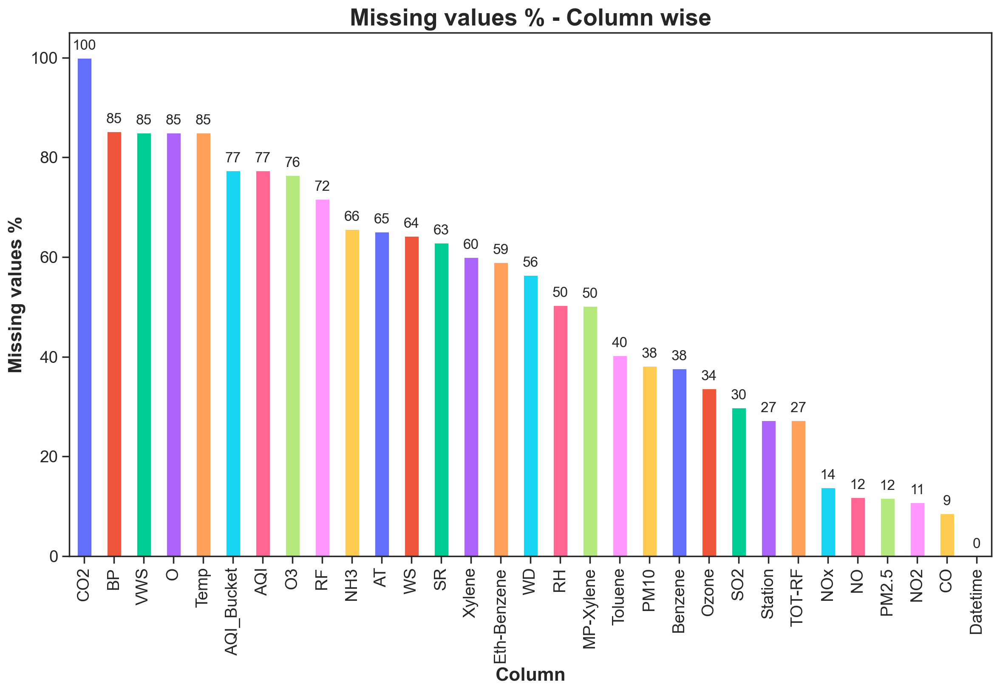

In [19]:
plt.figure(figsize=(14,8))
ax = df_describe_object['Missing %'].sort_values(ascending=False).plot.bar(color=custom_colors)
plt.title("Missing values % - Column wise")
plt.xlabel("Column")
plt.ylabel("Missing values %")

for p in ax.patches:
        ax.annotate(round(p.get_height()),
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center',
                    va='center',
                    fontsize=12,
                    xytext=(0, 10),
                    textcoords='offset points')

In [20]:
# Same figure with Plotly 

fig = px.bar(df_describe_object['Missing %'].sort_values(ascending=False),
       title="Missing values % - Column wise",
       text_auto=True)

fig.update_layout(
    xaxis_title='Column',
    yaxis_title='Missing values %'
)

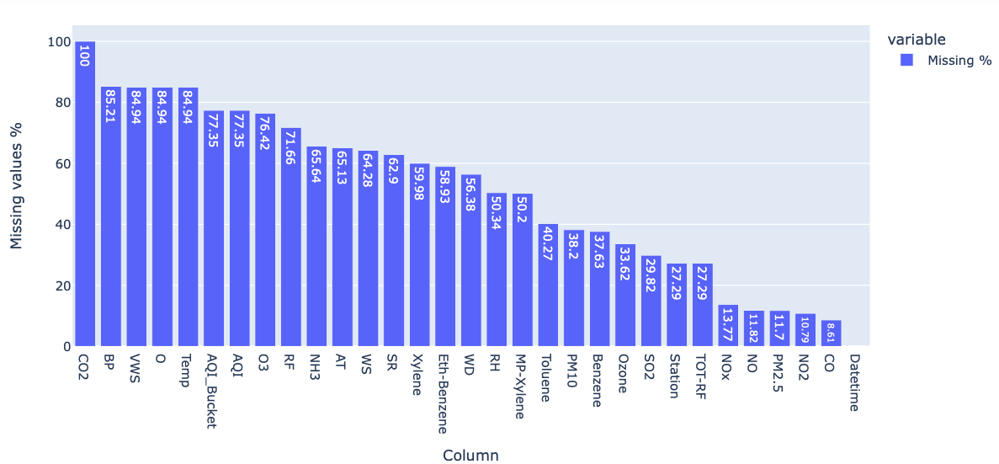

## 2.2 Data cleaning

### 2.2.1 Changing data types & replacing None with NaN

In [21]:
# Reading the data again

compiled = pd.read_csv('../../data/preprocessing_data/Gurugram_Hourly_Compiled.csv')
compiled

/var/folders/27/b03t8q596qvcmtyqjtnh0w6w0000gn/T/ipykernel_5368/1729635634.py:3: DtypeWarning:

Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,25,26,27,30) have mixed types. Specify dtype option on import or set low_memory=False.



,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
0,04-03-2020 00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.5,3.01,5.08,2.04,...,3.1,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,04-03-2020 01:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,2,...,3.03,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,04-03-2020 02:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.6,1.85,12.72,2.02,...,3.08,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,04-03-2020 03:00,Vikas Sadan,67.6,377.93,29.18,317.53,10.53,1.31,11.46,1.96,...,3.02,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,04-03-2020 04:00,Vikas Sadan,72.72,319.8,33.66,273.25,9.98,0.63,4.76,2.01,...,2.97,None,None,0.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147526,2020-06-30 20:00:00,NaN,54.74,6.23,10.67,12.6,4.18,0.6,NaN,2.14,...,4.7,NaN,NaN,NaN,135.42,2.95,NaN,70.95,154.0,Moderate
147527,2020-06-30 21:00:00,NaN,54.37,6.3,10.28,11.88,4.03,1.2,NaN,1.87,...,4.29,NaN,NaN,NaN,136.11,3.47,NaN,55.13,154.0,Moderate
147528,2020-06-30 22:00:00,NaN,50.34,6.93,10.36,13.01,6.17,1.0,NaN,2.41,...,4.59,NaN,NaN,NaN,147.32,3.76,NaN,42.60,155.0,Moderate
147529,2020-06-30 23:00:00,NaN,53.23,6.64,10.3,12.75,6.31,0.86,NaN,2.54,...,4.61,NaN,NaN,NaN,163.15,3.36,NaN,35.61,156.0,Moderate


In [22]:
# Changing data types - Convert object to float and string

schema = {
    "Datetime": str, # We will change it again to datetime
    "Station": str,
    "PM2.5": np.float64,
    "NO": np.float64,
    "NO2": np.float64,
    "NOx": np.float64,
    "SO2": np.float64,
    "CO": np.float64,
    "Ozone": np.float64,
    "Benzene": np.float64,
    "Toluene": np.float64,
    "Eth-Benzene": np.float64,
    "MP-Xylene": np.float64,
    "O": np.float64,
    "Temp": np.float64,
    "RH": np.float64,
    "WS": np.float64,
    "WD": np.float64,
    "SR": np.float64,
    "BP": np.float64,
    "VWS": np.float64,
    "Xylene": np.float64,
    "AT": np.float64,
    "RF": np.float64,
    "TOT-RF": np.float64,
    "PM10": np.float64,
    "NH3": np.float64,
    "CO2": np.float64,
    "O3": np.float64,
    "AQI": np.float64,
    "AQI_Bucket": str
}

In [23]:
# Replace None with NaN

compiled.replace(to_replace=['None'], value=np.nan, inplace=True)
compiled

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
0,04-03-2020 00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.5,3.01,5.08,2.04,...,3.1,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,04-03-2020 01:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,2,...,3.03,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,04-03-2020 02:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.6,1.85,12.72,2.02,...,3.08,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,04-03-2020 03:00,Vikas Sadan,67.6,377.93,29.18,317.53,10.53,1.31,11.46,1.96,...,3.02,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,04-03-2020 04:00,Vikas Sadan,72.72,319.8,33.66,273.25,9.98,0.63,4.76,2.01,...,2.97,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147526,2020-06-30 20:00:00,NaN,54.74,6.23,10.67,12.6,4.18,0.6,NaN,2.14,...,4.7,NaN,NaN,NaN,135.42,2.95,NaN,70.95,154.0,Moderate
147527,2020-06-30 21:00:00,NaN,54.37,6.3,10.28,11.88,4.03,1.2,NaN,1.87,...,4.29,NaN,NaN,NaN,136.11,3.47,NaN,55.13,154.0,Moderate
147528,2020-06-30 22:00:00,NaN,50.34,6.93,10.36,13.01,6.17,1.0,NaN,2.41,...,4.59,NaN,NaN,NaN,147.32,3.76,NaN,42.60,155.0,Moderate
147529,2020-06-30 23:00:00,NaN,53.23,6.64,10.3,12.75,6.31,0.86,NaN,2.54,...,4.61,NaN,NaN,NaN,163.15,3.36,NaN,35.61,156.0,Moderate


In [24]:
# Change the data types

compiled = compiled.astype(schema)
compiled.dtypes

Datetime        object
Station         object
PM2.5          float64
NO             float64
NO2            float64
NOx            float64
SO2            float64
CO             float64
Ozone          float64
Benzene        float64
Toluene        float64
Eth-Benzene    float64
MP-Xylene      float64
O              float64
Temp           float64
RH             float64
WS             float64
WD             float64
SR             float64
BP             float64
VWS            float64
Xylene         float64
AT             float64
RF             float64
TOT-RF         float64
PM10           float64
NH3            float64
CO2            float64
O3             float64
AQI            float64
AQI_Bucket      object
dtype: object

In [191]:
# Converting Datetime - We will do it later

# Month and year are reversed, to fix it, use dayfirst parameter.

# compiled['Datetime'] = pd.to_datetime(compiled['Datetime'],dayfirst=True, format='%Y-%m-%d %H:%M')

In [25]:
# Calculating unique value counts in Station column

compiled['Station'].value_counts(dropna=False)

nan            40258
Sector 51      26825
Vikas Sadan    26816
NISE           26816
Teri Gram      26816
Name: Station, dtype: int64

- We see 40k nan values. We have to clean them.
- Replace nan to **"No Station"** for better readability.

In [26]:
compiled['Station'].replace(to_replace=['nan'], value="No Station", inplace=True)
compiled.head()

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
0,04-03-2020 00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.50,3.01,5.08,2.04,...,3.10,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
1,04-03-2020 01:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,2.00,...,3.03,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
2,04-03-2020 02:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.60,1.85,12.72,2.02,...,3.08,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
3,04-03-2020 03:00,Vikas Sadan,67.60,377.93,29.18,317.53,10.53,1.31,11.46,1.96,...,3.02,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
4,04-03-2020 04:00,Vikas Sadan,72.72,319.80,33.66,273.25,9.98,0.63,4.76,2.01,...,2.97,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan


In [27]:
# Checking unique Station values

compiled['Station'].unique()

array(['Vikas Sadan', 'Sector 51', 'NISE', 'Teri Gram', 'No Station'],
      dtype=object)

### 2.2.2 Plotting Total missing values count & percentage by Station

<AxesSubplot: >

Text(0.5, 1.0, 'Total missing values by Station')

Text(0.5, 0, 'Column')

Text(0, 0.5, 'Count')

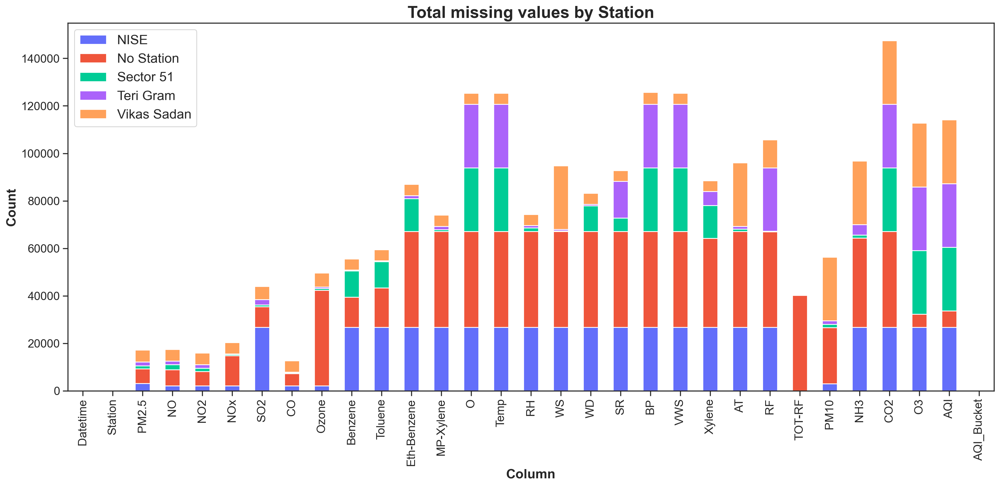

In [28]:
# Plotting the missing values by Station

compiled.groupby(['Station']).apply(lambda x: x.isnull().sum() + (x == "None").sum()).T.plot.bar(figsize=(20,8), 
                                                                                                 stacked=True, 
                                                                                                 color=custom_colors)
plt.title("Total missing values by Station")
plt.xlabel("Column")
plt.ylabel("Count")
plt.legend(loc='upper left', fontsize=16)

In [29]:
fig = px.bar(compiled.groupby(
    ['Station']).apply(lambda x: x.isnull().sum() + (x == "None").sum() ).T,
       text_auto=True,
       title='Total missing values by station',
)

fig.update_layout(
    xaxis_title='Column',
    yaxis_title='Count'
)

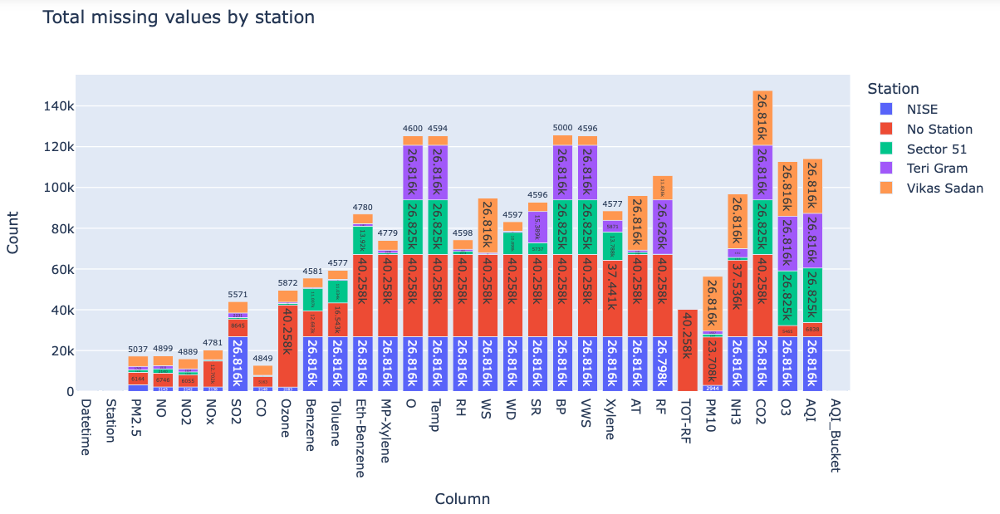

<AxesSubplot: >

Text(0.5, 1.0, 'Percentage of missing values by station')

Text(0.5, 0, 'Column')

Text(0, 0.5, 'Percentage')

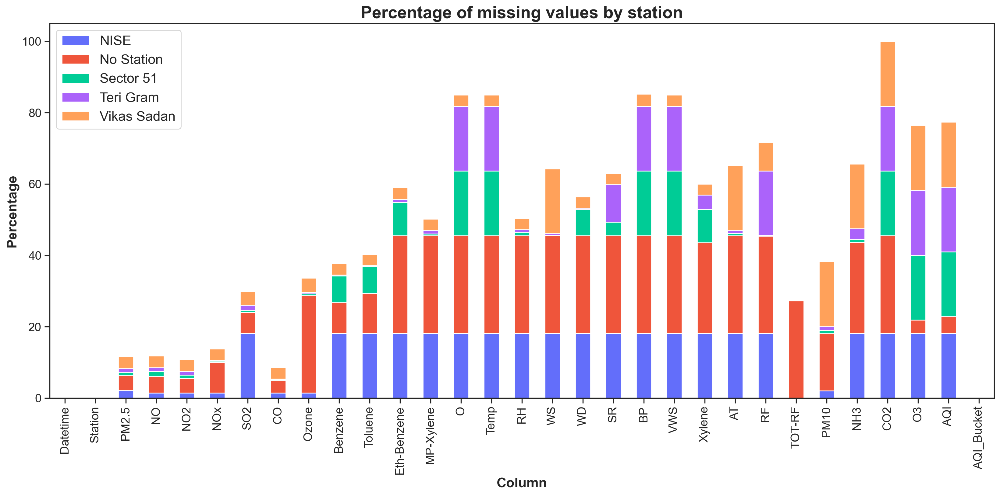

In [30]:
compiled.groupby(['Station']).apply(lambda x: round((
    (x.isnull().sum() + (x == "None").sum()) / compiled.shape[0]) * 100, 2)).T.plot.bar(figsize=(20,8), 
                                                                                        stacked=True,
                                                                                        color=custom_colors)
plt.title("Percentage of missing values by station")
plt.xlabel("Column")
plt.ylabel("Percentage")
plt.legend(loc='upper left', fontsize=16)

In [31]:
fig = px.bar(compiled.groupby(['Station']).apply(lambda x: round((
    (x.isnull().sum() + (x == "None").sum()) / compiled.shape[0]) * 100, 2)).T,
       text_auto=True,
       title='Percentage of missing values by station')

fig.update_layout(
    xaxis_title='Column',
    yaxis_title='Percentage'
)

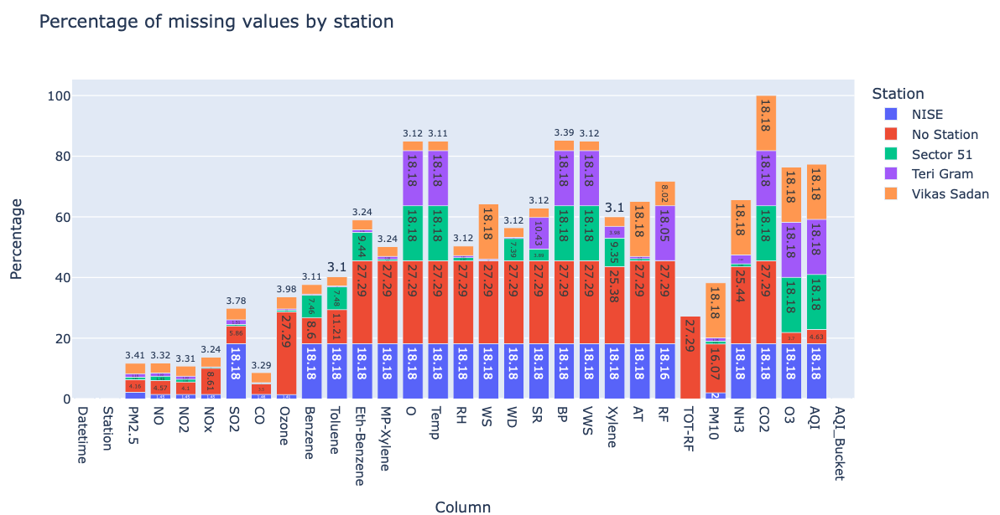

- ### Columns to fill missing values (take average - fill NISE)
    - SO2
- ### Columns to remove - (Have more than 50% of missing values)
    - Benzene, Toulene, Eth-Benzene, MP_Xylene, O, Temp, RH, WS, WD, SR, BP, VWS, Xylene, AT, RF, TOT-RF, NH3, CO2, O3
    - We are removing TOT-RF as it is present in only 1 station and might not be much useful.
- ### Columns to compute
    - AQI and AQI_bucket

### 2.2.3 Filling missing values

### 2.2.3.1 Checking if we can fill with average

In [32]:
# Let's compare NISE with average of other 3 stations

# SO2, MP_Xylene, RH

compiled.groupby(["Station"]).SO2.count()
compiled.groupby(["Station"])["MP-Xylene"].count()
compiled.groupby(["Station"]).RH.count()

Station
NISE               0
No Station     31613
Sector 51      26092
Teri Gram      24585
Vikas Sadan    21245
Name: SO2, dtype: int64

Station
NISE               0
No Station         0
Sector 51      26065
Teri Gram      25368
Vikas Sadan    22037
Name: MP-Xylene, dtype: int64

Station
NISE               0
No Station         0
Sector 51      25252
Teri Gram      25791
Vikas Sadan    22218
Name: RH, dtype: int64

- #### We see that SO2, MP_Xylene, RH is completely absent in NISE. So we can take average after filling NaNs. Let us check if NISE is really average of other 3 stations NO, NO2, NOx

In [33]:
# NO

compiled.groupby(["Station"])["NO"].mean()
print("NISE NO value", compiled.groupby(["Station"])["NO"].mean()[0])
print("Other stations average NO value", compiled.groupby(["Station"])["NO"].mean()[1:].values.mean())

Station
NISE            9.795104
No Station     17.923547
Sector 51      14.548590
Teri Gram      12.234311
Vikas Sadan    19.851806
Name: NO, dtype: float64

NISE NO value 9.795103554492766
Other stations average NO value 16.139563469563395


In [34]:
# NO2

compiled.groupby(["Station"])["NO2"].mean()
print("NISE NO2 value", compiled.groupby(["Station"])["NO2"].mean()[0])
print("Other stations average NO2 value", compiled.groupby(["Station"])["NO2"].mean()[1:].values.mean())

Station
NISE           21.655308
No Station     23.117616
Sector 51      18.307624
Teri Gram      16.427935
Vikas Sadan    28.926956
Name: NO2, dtype: float64

NISE NO2 value 21.655308016535624
Other stations average NO2 value 21.695032789631558


In [35]:
# PM2.5

compiled.groupby(["Station"])["PM2.5"].mean()
print("NISE PM2.5 value", compiled.groupby(["Station"])["PM2.5"].mean()[0])
print("Other stations average PM2.5 value", compiled.groupby(["Station"])["PM2.5"].mean()[1:].values.mean())

Station
NISE            79.544378
No Station     114.449409
Sector 51      105.474428
Teri Gram       86.103672
Vikas Sadan     93.782973
Name: PM2.5, dtype: float64

NISE PM2.5 value 79.54437785291631
Other stations average PM2.5 value 99.95262038447153


In [36]:
# NOx

compiled.groupby(["Station"])["NOx"].mean()
print("NISE NOx value", compiled.groupby(["Station"])["NOx"].mean()[0])
print("Other stations average NOx value", compiled.groupby(["Station"])["NOx"].mean()[1:].values.mean())

Station
NISE           30.216896
No Station     30.032255
Sector 51      15.634916
Teri Gram      19.873615
Vikas Sadan    32.722258
Name: NOx, dtype: float64

NISE NOx value 30.216896020747228
Other stations average NOx value 24.565761254063396


### Conclusion
- #### We see the average is a good way to fill NISE station's missing values for SO2. 
- #### But it should be filled in such a way that on a day, if SO2 is absent in NISE, that day's other 3 station's SO2 average should be filled.

In [37]:
compiled.groupby(["Station"]).SO2.count()
compiled.groupby(["Station"])["MP-Xylene"].count()
compiled.groupby(["Station"]).RH.count()

Station
NISE               0
No Station     31613
Sector 51      26092
Teri Gram      24585
Vikas Sadan    21245
Name: SO2, dtype: int64

Station
NISE               0
No Station         0
Sector 51      26065
Teri Gram      25368
Vikas Sadan    22037
Name: MP-Xylene, dtype: int64

Station
NISE               0
No Station         0
Sector 51      25252
Teri Gram      25791
Vikas Sadan    22218
Name: RH, dtype: int64

- #### Before filling NISE with mean, we should ensure that other stations should not have any missing values.

### 2.2.3.2 SO2 column

In [38]:
compiled['SO2'].describe()

count    103535.000000
mean          7.818233
std           9.874812
min           0.010000
25%           2.490000
50%           4.960000
75%           9.310000
max         199.370000
Name: SO2, dtype: float64

In [39]:
compiled[compiled['SO2'] > 19.31].sort_values(['SO2'])

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
19410,21-05-2022 18:00,Vikas Sadan,76.40,19.57,16.46,11.93,19.32,0.51,43.33,3.27,...,3.64,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,nan
146460,2020-05-17 10:00:00,No Station,124.93,24.48,29.94,35.05,19.32,0.85,NaN,7.25,...,2.38,NaN,NaN,NaN,191.35,31.42,NaN,147.97,224.0,Poor
23891,24-11-2022 11:00,Vikas Sadan,92.19,18.74,16.06,32.54,19.32,0.78,18.88,2.10,...,0.51,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,nan
27129,17-03-2020 01:00,Sector 51,250.68,12.64,30.74,26.20,19.32,1.10,10.74,8.33,...,25.94,18.06,0.0,0.0,382.46,79.55,NaN,NaN,NaN,nan
132746,2018-10-24 00:00:00,No Station,146.68,136.81,59.31,146.18,19.32,1.40,NaN,11.16,...,NaN,NaN,NaN,NaN,374.83,NaN,NaN,7.84,318.0,Very Poor
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28903,29-05-2020 23:00,Sector 51,29.86,NaN,13.95,4.86,192.88,0.46,47.79,2.94,...,3.19,25.35,0.0,0.0,53.95,21.38,NaN,NaN,NaN,nan
28902,29-05-2020 22:00,Sector 51,NaN,NaN,13.23,4.36,193.12,0.48,49.84,2.96,...,3.24,25.52,0.0,0.0,NaN,21.56,NaN,NaN,NaN,nan
28901,29-05-2020 21:00,Sector 51,NaN,0.18,12.98,4.87,194.97,0.53,55.91,3.06,...,3.37,25.09,0.0,0.0,NaN,21.29,NaN,NaN,NaN,nan
28947,31-05-2020 19:00,Sector 51,22.44,NaN,NaN,0.00,196.39,0.60,51.98,0.92,...,1.22,NaN,0.0,0.0,93.51,NaN,NaN,NaN,NaN,nan


In [40]:
# Checking values above 75% i.e 9.31 in SO2

compiled[compiled['SO2'] >= 9.31]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
0,04-03-2020 00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.50,3.01,5.08,2.04,...,3.10,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
3,04-03-2020 03:00,Vikas Sadan,67.60,377.93,29.18,317.53,10.53,1.31,11.46,1.96,...,3.02,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
4,04-03-2020 04:00,Vikas Sadan,72.72,319.80,33.66,273.25,9.98,0.63,4.76,2.01,...,2.97,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
5,04-03-2020 05:00,Vikas Sadan,75.97,263.58,26.00,224.17,12.04,1.31,5.08,2.00,...,2.95,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
6,04-03-2020 06:00,Vikas Sadan,76.28,222.80,27.10,192.04,12.20,0.07,4.27,2.02,...,2.96,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147512,2020-06-30 06:00:00,No Station,30.48,6.78,9.59,12.32,9.34,0.42,NaN,2.68,...,5.07,NaN,NaN,NaN,112.91,3.53,NaN,33.54,116.0,Moderate
147513,2020-06-30 07:00:00,No Station,31.90,6.88,9.74,12.14,9.85,0.53,NaN,2.67,...,5.12,NaN,NaN,NaN,120.28,3.52,NaN,16.52,115.0,Moderate
147518,2020-06-30 12:00:00,No Station,52.91,5.57,11.47,11.10,12.15,1.27,NaN,2.16,...,4.96,NaN,NaN,NaN,95.70,3.72,NaN,67.36,128.0,Moderate
147521,2020-06-30 15:00:00,No Station,61.14,4.98,12.24,10.83,10.16,0.54,NaN,1.96,...,4.56,NaN,NaN,NaN,79.83,2.98,NaN,113.45,137.0,Moderate


In [41]:
# >75% is 9.31. It is 17.5 % of the data.

(compiled[compiled['SO2'] >= 9.31].shape[0] / compiled.shape[0]) * 100

17.554276728280836

<Figure size 640x480 with 0 Axes>

Text(0.5, 1.0, 'SO2 Box plot')

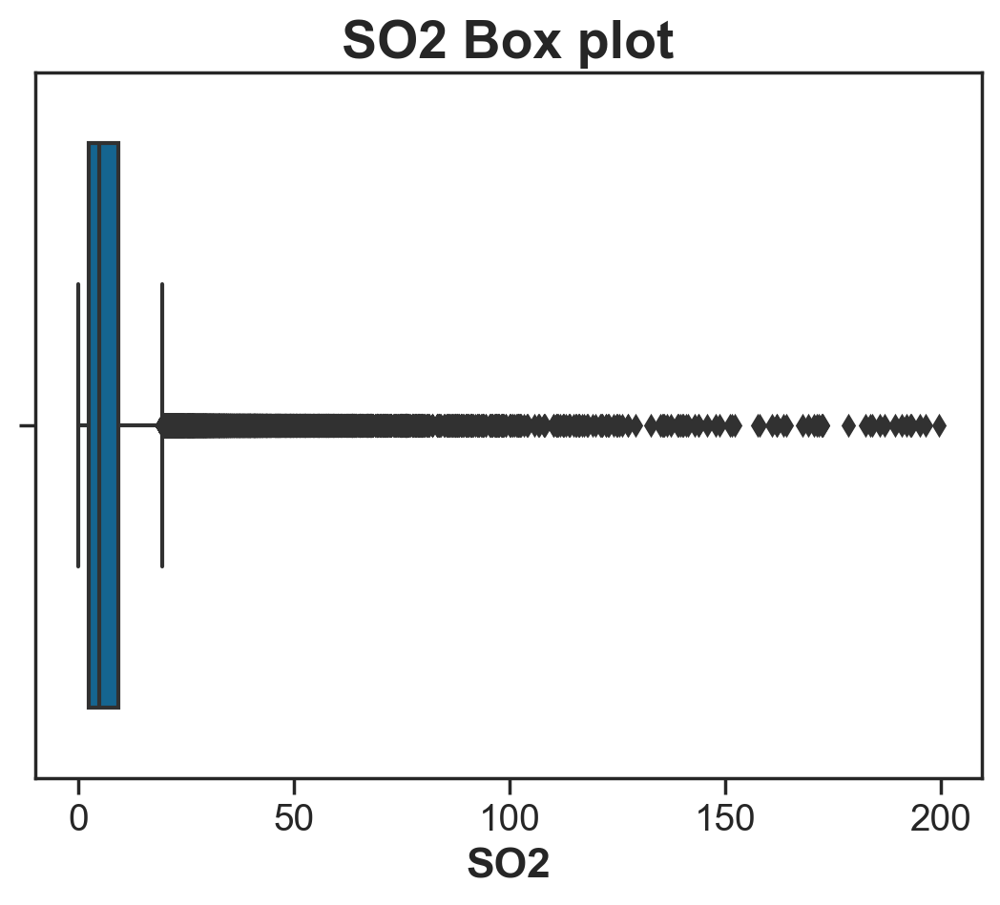

In [42]:
plt.figure()
ax = sns.boxplot(data = compiled, x='SO2')
plt.title("SO2 Box plot")

Text(0.5, 1.0, 'SO2 Displot')

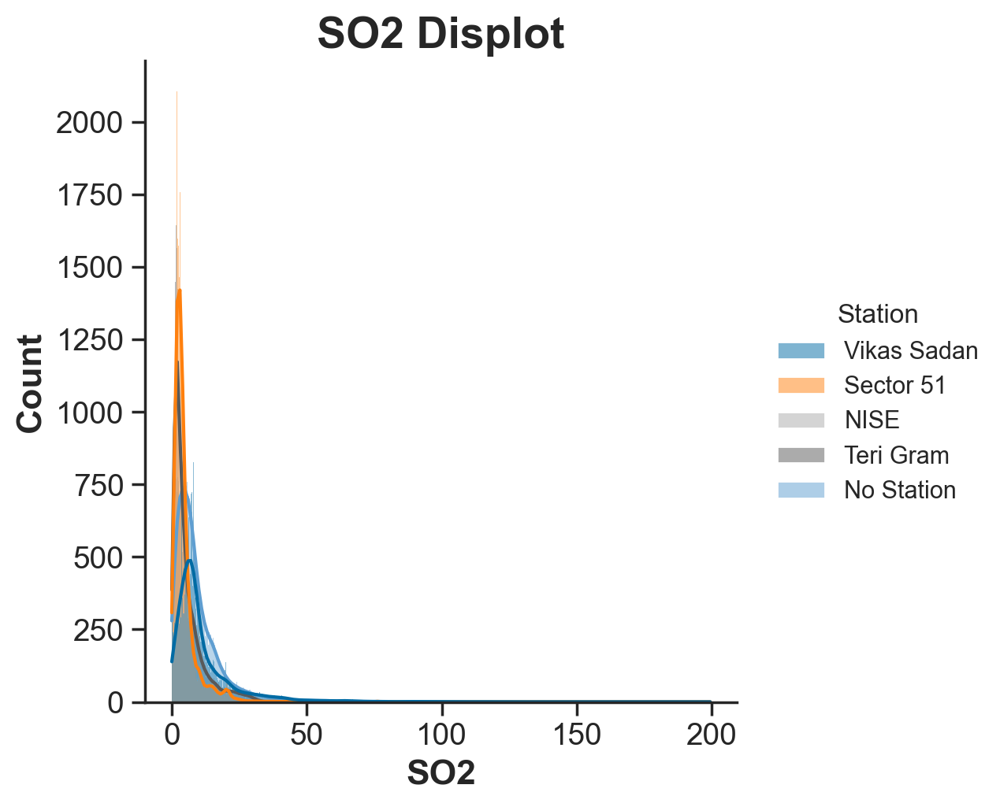

In [43]:
sns.displot(data = compiled, x='SO2', kde=True, hue='Station')
plt.title("SO2 Displot")

<AxesSubplot: xlabel='SO2'>

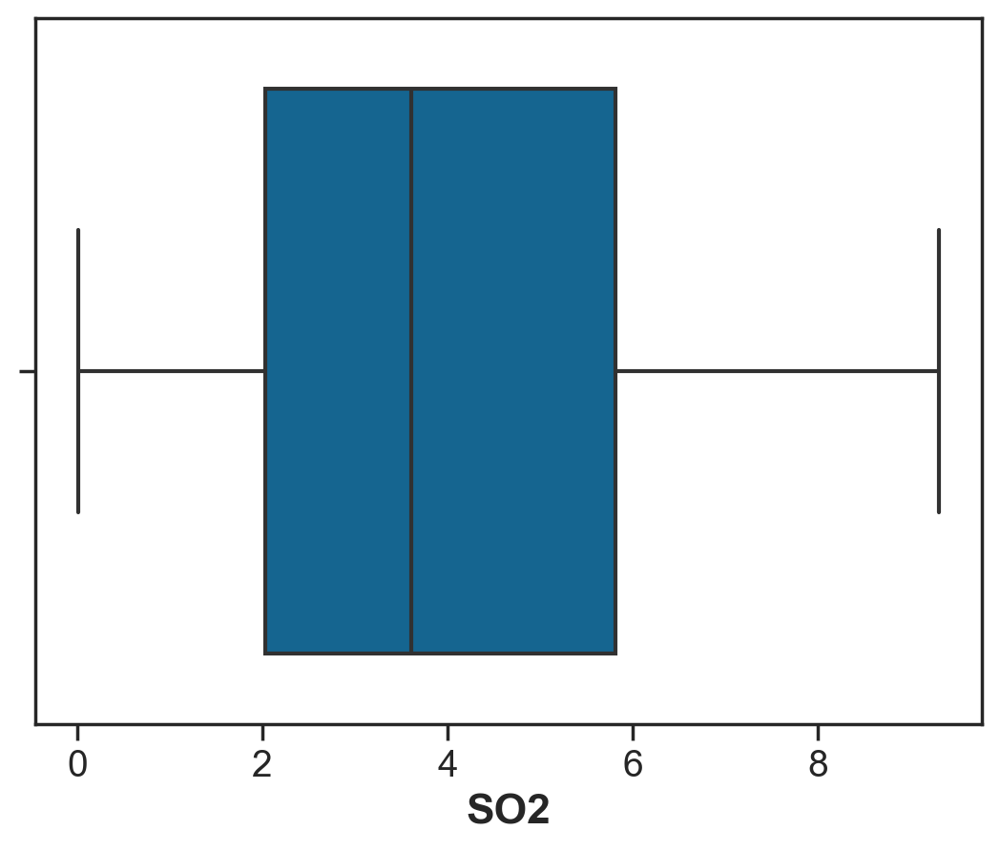

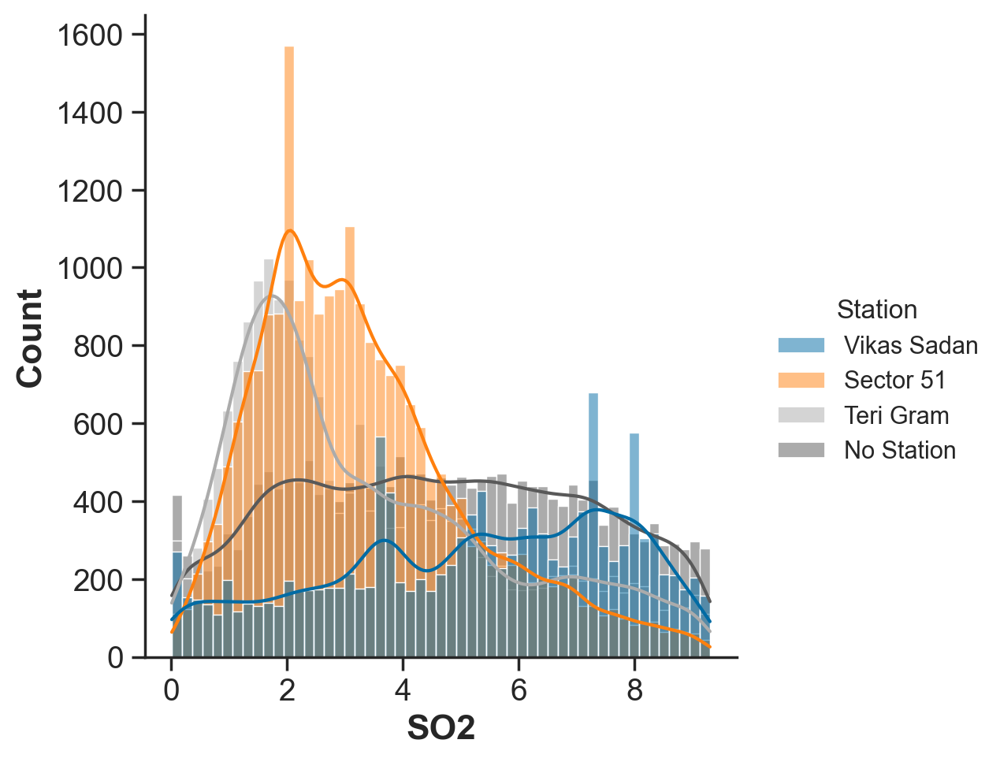

In [44]:
# Checking less than 75% value in SO2 i.e 9.31

sns.boxplot(data = compiled[compiled['SO2'] < 9.31], x='SO2')
sns.displot(data = compiled[compiled['SO2'] < 9.31], x='SO2', kde=True, hue='Station')

- #### First fill other 3 stations by bfill or ffill (but it should be done station wise)
- #### Example, if on a day Vikas Sadan has missing value, then previous day's in Vikas Sadan should be filled. Station should be the same.

### 2.2.3.4 Analysing missing values in Vikas Sadan - SO2

In [45]:
compiled[compiled['Station'] == "Vikas Sadan"]

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,Xylene,AT,RF,TOT-RF,PM10,NH3,CO2,O3,AQI,AQI_Bucket
0,04-03-2020 00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.50,3.01,5.08,2.04,...,3.10,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
1,04-03-2020 01:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,2.00,...,3.03,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
2,04-03-2020 02:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.60,1.85,12.72,2.02,...,3.08,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
3,04-03-2020 03:00,Vikas Sadan,67.60,377.93,29.18,317.53,10.53,1.31,11.46,1.96,...,3.02,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
4,04-03-2020 04:00,Vikas Sadan,72.72,319.80,33.66,273.25,9.98,0.63,4.76,2.01,...,2.97,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,nan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26811,26-03-2023 03:00,Vikas Sadan,83.22,23.90,49.59,70.03,41.30,0.87,26.16,4.57,...,12.70,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,nan
26812,26-03-2023 04:00,Vikas Sadan,71.96,24.25,53.15,71.91,40.56,0.66,17.46,8.22,...,3.51,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,nan
26813,26-03-2023 05:00,Vikas Sadan,75.47,24.55,54.38,64.34,40.82,0.28,37.73,8.21,...,3.50,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,nan
26814,26-03-2023 06:00,Vikas Sadan,69.07,23.09,54.48,72.73,39.29,0.43,22.46,8.15,...,3.55,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,nan


In [46]:
temp_vikas_sadan_so2_plot = compiled[compiled['Station'] == "Vikas Sadan"]['SO2']
temp_vikas_sadan_so2_plot

0        10.50
1         5.64
2         7.60
3        10.53
4         9.98
         ...  
26811    41.30
26812    40.56
26813    40.82
26814    39.29
26815      NaN
Name: SO2, Length: 26816, dtype: float64

In [47]:
# Setting index

temp_vikas_sadan_so2_plot.index = (pd.to_datetime(compiled[compiled['Station'] == "Vikas Sadan"]['Datetime'] ))

In [48]:
temp_vikas_sadan_so2_plot

Datetime
2020-04-03 00:00:00    10.50
2020-04-03 01:00:00     5.64
2020-04-03 02:00:00     7.60
2020-04-03 03:00:00    10.53
2020-04-03 04:00:00     9.98
                       ...  
2023-03-26 03:00:00    41.30
2023-03-26 04:00:00    40.56
2023-03-26 05:00:00    40.82
2023-03-26 06:00:00    39.29
2023-03-26 07:00:00      NaN
Name: SO2, Length: 26816, dtype: float64

<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='SO2'>

Text(0.5, 1.0, 'Vikas Sadan SO2 data')

Text(0.5, 0, 'Datetime')

Text(0, 0.5, 'SO2')

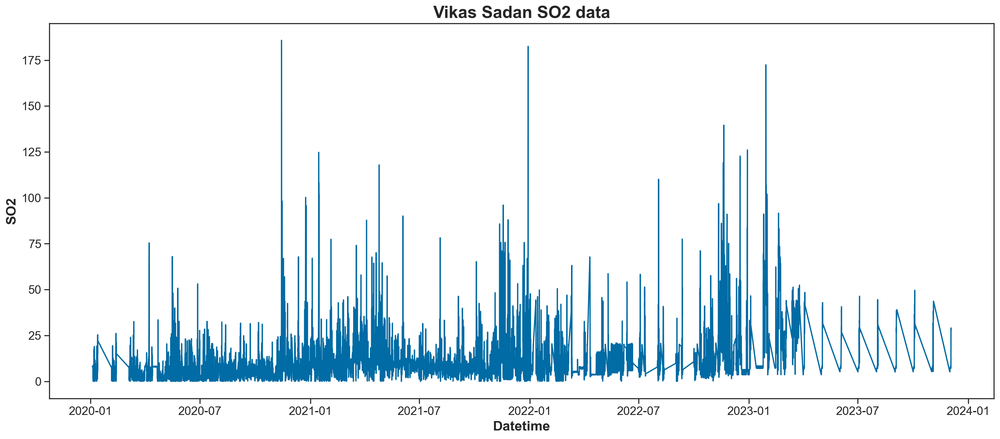

In [49]:
plt.figure(figsize=(20,8))
sns.lineplot(temp_vikas_sadan_so2_plot)
plt.title("Vikas Sadan SO2 data")
plt.xlabel("Datetime")
plt.ylabel("SO2")

### 2.2.4 Adding day, month, year, week, hour columns

In [50]:
from datetime import datetime

temp1 = compiled['Datetime'][:107273].apply(lambda x : datetime.strptime(x, '%d-%m-%Y %H:%M'))
temp = compiled['Datetime'][107273:]
temp.apply(lambda x : datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
temp2 = compiled['Datetime'][107273:].apply(lambda x : datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
temp3 = pd.concat([temp1, temp2])
compiled['Datetime_2'] = temp3

compiled['Datetime'] = compiled['Datetime_2']

compiled.drop(['Datetime_2'], axis=1,inplace=True)

day =[]
month = []
year = []
week = []
hour = []

for i in range(compiled.shape[0]):
    day.append(compiled['Datetime'][i].day)
    month.append(compiled['Datetime'][i].month)
    year.append(compiled['Datetime'][i].year)
    week.append(compiled['Datetime'][i].week)
    hour.append(compiled['Datetime'][i].hour)
compiled['Day'] = day
compiled['Month'] = month
compiled['Year'] = year
compiled['Week'] = week
compiled['Hour'] = hour

107273   2015-11-27 15:00:00
107274   2015-11-27 16:00:00
107275   2015-11-27 17:00:00
107276   2015-11-27 18:00:00
107277   2015-11-27 19:00:00
                 ...        
147526   2020-06-30 20:00:00
147527   2020-06-30 21:00:00
147528   2020-06-30 22:00:00
147529   2020-06-30 23:00:00
147530   2020-07-01 00:00:00
Name: Datetime, Length: 40258, dtype: datetime64[ns]

In [51]:
# # Month and year are reversed, to fix it, use dayfirst parameter.

# compiled['Datetime'] = pd.to_datetime(compiled['Datetime'],dayfirst=True, format='%Y-%m-%d %H:%M:%S')

In [52]:
# Populate required columns for better visualization

compiled['Day'] = compiled['Datetime'].dt.day
compiled['Month'] = compiled['Datetime'].dt.month
compiled['Year'] = compiled['Datetime'].dt.year
compiled['Week'] = compiled['Datetime'].dt.isocalendar().week
compiled['Hour'] = compiled['Datetime'].dt.hour

### 2.2.5 Filling missing values in Vikas Sadan - SO2 column

#### Task - Plot the barplot - Month vs Missing values in Vikas Sadan

In [53]:
vikas_sadan  = compiled[compiled['Station'] == "Vikas Sadan"]
vikas_sadan

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,NH3,CO2,O3,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
0,2020-03-04 00:00:00,Vikas Sadan,60.92,141.22,61.53,144.62,10.50,3.01,5.08,2.04,...,NaN,NaN,NaN,NaN,nan,4,3,2020,10,0
1,2020-03-04 01:00:00,Vikas Sadan,56.88,177.38,56.39,170.94,5.64,5.38,6.15,2.00,...,NaN,NaN,NaN,NaN,nan,4,3,2020,10,1
2,2020-03-04 02:00:00,Vikas Sadan,63.33,302.33,40.26,262.69,7.60,1.85,12.72,2.02,...,NaN,NaN,NaN,NaN,nan,4,3,2020,10,2
3,2020-03-04 03:00:00,Vikas Sadan,67.60,377.93,29.18,317.53,10.53,1.31,11.46,1.96,...,NaN,NaN,NaN,NaN,nan,4,3,2020,10,3
4,2020-03-04 04:00:00,Vikas Sadan,72.72,319.80,33.66,273.25,9.98,0.63,4.76,2.01,...,NaN,NaN,NaN,NaN,nan,4,3,2020,10,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26811,2023-03-26 03:00:00,Vikas Sadan,83.22,23.90,49.59,70.03,41.30,0.87,26.16,4.57,...,NaN,NaN,NaN,NaN,nan,26,3,2023,12,3
26812,2023-03-26 04:00:00,Vikas Sadan,71.96,24.25,53.15,71.91,40.56,0.66,17.46,8.22,...,NaN,NaN,NaN,NaN,nan,26,3,2023,12,4
26813,2023-03-26 05:00:00,Vikas Sadan,75.47,24.55,54.38,64.34,40.82,0.28,37.73,8.21,...,NaN,NaN,NaN,NaN,nan,26,3,2023,12,5
26814,2023-03-26 06:00:00,Vikas Sadan,69.07,23.09,54.48,72.73,39.29,0.43,22.46,8.15,...,NaN,NaN,NaN,NaN,nan,26,3,2023,12,6


In [54]:
# Checking null values in SO2

vikas_sadan["SO2"].isnull().sum()
vikas_sadan["SO2"].isna().sum()

5571

5571

- There are 5571 NaN values in SO2

In [57]:
# X-axis group (year, month)
# Y-axis count of missing values

vikas_sadan_na = vikas_sadan[vikas_sadan['SO2'].isna()]
vikas_sadan_na
vikas_sadan_na.groupby(by = ['Year',"Month"]).SO2.sum()

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,NH3,CO2,O3,AQI,AQI_Bucket,Day,Month,Year,Week,Hour
64,2020-03-06 16:00:00,Vikas Sadan,13.32,7.66,51.92,31.73,NaN,2.90,45.10,2.00,...,NaN,NaN,NaN,NaN,nan,6,3,2020,10,16
97,2020-03-08 01:00:00,Vikas Sadan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,nan,8,3,2020,10,1
100,2020-03-08 04:00:00,Vikas Sadan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,nan,8,3,2020,10,4
127,2020-03-09 07:00:00,Vikas Sadan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,nan,9,3,2020,11,7
137,2020-03-09 17:00:00,Vikas Sadan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,nan,9,3,2020,11,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26775,2023-03-24 15:00:00,Vikas Sadan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,nan,24,3,2023,12,15
26776,2023-03-24 16:00:00,Vikas Sadan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,nan,24,3,2023,12,16
26777,2023-03-24 17:00:00,Vikas Sadan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,nan,24,3,2023,12,17
26783,2023-03-24 23:00:00,Vikas Sadan,37.04,17.30,30.48,50.05,NaN,0.96,44.74,9.16,...,NaN,NaN,NaN,NaN,nan,24,3,2023,12,23


Year  Month
2020  3        0.0
      4        0.0
      5        0.0
      6        0.0
      7        0.0
      8        0.0
      9        0.0
      10       0.0
      11       0.0
      12       0.0
2021  1        0.0
      2        0.0
      3        0.0
      4        0.0
      5        0.0
      6        0.0
      7        0.0
      8        0.0
      9        0.0
      10       0.0
      11       0.0
      12       0.0
2022  1        0.0
      2        0.0
      3        0.0
      4        0.0
      5        0.0
      6        0.0
      7        0.0
      8        0.0
      9        0.0
      10       0.0
      11       0.0
      12       0.0
2023  1        0.0
      2        0.0
      3        0.0
Name: SO2, dtype: float64

- But, here we get 0 NaNs. Which is wrong. So, trying a different approach below.

In [59]:
vikas_sadan_na.groupby(by = ['Year',"Month"]).count() # NaN is replaced with 0

Datetime  Station  PM2.5  NO  NO2  NOx  SO2  CO  Ozone  Benzene  \
Year Month                                                                    
2020 3            98       98     43  45   45   45    0  45     43       45   
     4            26       26      7   8    8    8    0   6      8        8   
     5           224      224     87  95  100  100    0  93     95       97   
     6           157      157     67  75   77   79    0  75     75       78   
     7           129      129     37  38   45   49    0  48     44       54   
     8            40       40     24  27   28   28    0  27     26       28   
     9            39       39     14  17   17   17    0  17     13       17   
     10           37       37     18  19   19   19    0  19     14       19   
     11           59       59     28  29   30   30    0  31     24       31   
     12           62       62     27  24   19   24    0  27     20       29   
2021 1            40       40     27  26   26   26    0  28     27       29   
     2            35       35     32  33    9   33    0  33     30       33   
     3             6        6      6   6    6    6    0   6      6        6   
     4            22       22      3   7    7    7    0   8      7        8   
     5            96       96     29  19   20   21    0  20     18       33   
     6            34       34      6   7    9    8    0   9      8        9   
     7            92       92     12  12   14   15    0  16     10       16   
     8            95       95     19  21   22   22    0  22     19       23   
     9            57       57     18  23   22   23    0  21     19       23   
     10          156      156     19  18   18   18    0  22     18       22   
     11           93       93     19  19   19   19    0  18     18       19   
     12          160      160     22  24   23   23    0  24     23       23   
2022 1           290      290     58  58   58   58    0  60     60       61   
     2            57       57     21  22   22   22    0  23     20       22   
     3           113      113     22  22   22   22    0  23     22       23   
     4           177      177      1   3    3    3    0   4      2        3   
     5           148      148      0   0    0    0    0   0      0        0   
     6           276      276      7   7    7    7    0   7      7        7   
     7           744      744      0   0    0    0    0   0      0        0   
     8           744      744      0   0    0    0    0   0      0        0   
     9           720      720      0   0    0    0    0   0      0        0   
     10          259      259     38  44   44   44    0  41     36       44   
     11          111      111     55  61   61   61    0  58     59       61   
     12           47       47     41  45   43   45    0  42     42       43   
2023 1             9        9      2   3    3    3    0   4      2        3   
     2            34       34     19  30   30   30    0  21     21       30   
     3            85       85     16  71   71   71    0  13     39       71   

            ...  TOT-RF  PM10  NH3  CO2  O3  AQI  AQI_Bucket  Day  Week  Hour  
Year Month  ...                                                                
2020 3      ...      98     0    0    0   0    0          98   98    98    98  
     4      ...      26     0    0    0   0    0          26   26    26    26  
     5      ...     224     0    0    0   0    0         224  224   224   224  
     6      ...     157     0    0    0   0    0         157  157   157   157  
     7      ...     129     0    0    0   0    0         129  129   129   129  
     8      ...      40     0    0    0   0    0          40   40    40    40  
     9      ...      39     0    0    0   0    0          39   39    39    39  
     10     ...      37     0    0    0   0    0          37   37    37    37  
     11     ...      59     0    0    0   0    0          59   59    59    59  
     12     ...      62     0    0    0   0    0  

In [61]:
# Temporarily fill NaN with 1 to get the count

vikas_sadan_na.fillna(1).groupby(by = ['Year',"Month"]).count() 

Datetime  Station  PM2.5   NO  NO2  NOx  SO2   CO  Ozone  Benzene  \
Year Month                                                                      
2020 3            98       98     98   98   98   98   98   98     98       98   
     4            26       26     26   26   26   26   26   26     26       26   
     5           224      224    224  224  224  224  224  224    224      224   
     6           157      157    157  157  157  157  157  157    157      157   
     7           129      129    129  129  129  129  129  129    129      129   
     8            40       40     40   40   40   40   40   40     40       40   
     9            39       39     39   39   39   39   39   39     39       39   
     10           37       37     37   37   37   37   37   37     37       37   
     11           59       59     59   59   59   59   59   59     59       59   
     12           62       62     62   62   62   62   62   62     62       62   
2021 1            40       40     40   40   40   40   40   40     40       40   
     2            35       35     35   35   35   35   35   35     35       35   
     3             6        6      6    6    6    6    6    6      6        6   
     4            22       22     22   22   22   22   22   22     22       22   
     5            96       96     96   96   96   96   96   96     96       96   
     6            34       34     34   34   34   34   34   34     34       34   
     7            92       92     92   92   92   92   92   92     92       92   
     8            95       95     95   95   95   95   95   95     95       95   
     9            57       57     57   57   57   57   57   57     57       57   
     10          156      156    156  156  156  156  156  156    156      156   
     11           93       93     93   93   93   93   93   93     93       93   
     12          160      160    160  160  160  160  160  160    160      160   
2022 1           290      290    290  290  290  290  290  290    290      290   
     2            57       57     57   57   57   57   57   57     57       57   
     3           113      113    113  113  113  113  113  113    113      113   
     4           177      177    177  177  177  177  177  177    177      177   
     5           148      148    148  148  148  148  148  148    148      148   
     6           276      276    276  276  276  276  276  276    276      276   
     7           744      744    744  744  744  744  744  744    744      744   
     8           744      744    744  744  744  744  744  744    744      744   
     9           720      720    720  720  720  720  720  720    720      720   
     10          259      259    259  259  259  259  259  259    259      259   
     11          111      111    111  111  111  111  111  111    111      111   
     12           47       47     47   47   47   47   47   47     47       47   
2023 1             9        9      9    9    9    9    9    9      9        9   
     2            34       34     34   34   34   34   34   34     34       34   
     3            85       85     85   85   85   85   85   85     85       85   

            ...  TOT-RF  PM10  NH3  CO2   O3  AQI  AQI_Bucket  Day  Week  Hour  
Year Month  ...                                                                 
2020 3      ...      98    98   98   98   98   98          98   98    98    98  
     4      ...      26    26   26   26   26   26          26   26    26    26  
     5      ...     224   224  224  224  224  224         224  224   224   224  
     6      ...     157   157  157  157  157  157         157  157   157   157  
     7      ...     129   129  129  129  129  129         129  129   129   129  
     8      ...      40    40   40   40   40   40          40   40    40    40  
     9      ...      39    39   39   39   39   39          39   39    39    39  
     10     ...      37    37   37   37   37   37          37   37    37    37  
     11     ...      59    59   59   59   

In [62]:
vikas_sadan_na.groupby(by = ['Year']).count() # NaN is replaced with 0

,Datetime,Station,PM2.5,NO,NO2,NOx,SO2,CO,Ozone,Benzene,...,PM10,NH3,CO2,O3,AQI,AQI_Bucket,Day,Month,Week,Hour
Year,,,,,,,,,,,,,,,,,,,,,
2020,871,871,352,377,388,399,0,388,362,406,...,0,0,0,0,0,871,871,871,871,871
2021,886,886,212,215,195,221,0,227,203,244,...,0,0,0,0,0,886,886,886,886,886
2022,3686,3686,243,262,260,262,0,258,248,264,...,0,0,0,0,0,3686,3686,3686,3686,3686
2023,128,128,37,104,104,104,0,38,62,104,...,0,0,0,0,0,128,128,128,128,128


In [63]:
vikas_sadan_na.fillna(1).groupby(by = ['Year',"Month"]).SO2.count().reset_index() 

,Year,Month,SO2
0,2020,3,98
1,2020,4,26
2,2020,5,224
3,2020,6,157
4,2020,7,129
5,2020,8,40
6,2020,9,39
7,2020,10,37
8,2020,11,59
9,2020,12,62


- #### Now, we get the required data - Get number of missing values according to year & month.
- Assign this data to another DataFrame.

In [64]:
vikas_sadan_na_so2_count = vikas_sadan_na.fillna(1).groupby(by = ['Year',"Month"]).SO2.count().reset_index()
vikas_sadan_na_so2_count

,Year,Month,SO2
0,2020,3,98
1,2020,4,26
2,2020,5,224
3,2020,6,157
4,2020,7,129
5,2020,8,40
6,2020,9,39
7,2020,10,37
8,2020,11,59
9,2020,12,62


In [65]:
# For plotting, introduce a new column Year_Month - Join of Year & Month

vikas_sadan_na_so2_count["Year_Month"] = vikas_sadan_na_so2_count["Year"].map(str) + ", " + vikas_sadan_na_so2_count["Month"].map(str)
vikas_sadan_na_so2_count

,Year,Month,SO2,Year_Month
0,2020,3,98,"2020, 3"
1,2020,4,26,"2020, 4"
2,2020,5,224,"2020, 5"
3,2020,6,157,"2020, 6"
4,2020,7,129,"2020, 7"
5,2020,8,40,"2020, 8"
6,2020,9,39,"2020, 9"
7,2020,10,37,"2020, 10"
8,2020,11,59,"2020, 11"
9,2020,12,62,"2020, 12"


In [68]:
np.sum(vikas_sadan_na_so2_count['SO2'])
vikas_sadan["SO2"].isnull().sum()

5571

5571

- We got the data right!
- NaN values in the original dataframe and our new dataframe matches.
- Now, plot the barplot.

<Figure size 1400x800 with 0 Axes>

Text(0.5, 1.0, 'No. of missing values in SO2 in Vikas Sadan (grouped by month and year)')

Text(0.5, 0, 'Year_Month')

Text(0, 0.5, 'SO2')

[Text(0, 0, '2020, 3'),
 Text(1, 0, '2020, 4'),
 Text(2, 0, '2020, 5'),
 Text(3, 0, '2020, 6'),
 Text(4, 0, '2020, 7'),
 Text(5, 0, '2020, 8'),
 Text(6, 0, '2020, 9'),
 Text(7, 0, '2020, 10'),
 Text(8, 0, '2020, 11'),
 Text(9, 0, '2020, 12'),
 Text(10, 0, '2021, 1'),
 Text(11, 0, '2021, 2'),
 Text(12, 0, '2021, 3'),
 Text(13, 0, '2021, 4'),
 Text(14, 0, '2021, 5'),
 Text(15, 0, '2021, 6'),
 Text(16, 0, '2021, 7'),
 Text(17, 0, '2021, 8'),
 Text(18, 0, '2021, 9'),
 Text(19, 0, '2021, 10'),
 Text(20, 0, '2021, 11'),
 Text(21, 0, '2021, 12'),
 Text(22, 0, '2022, 1'),
 Text(23, 0, '2022, 2'),
 Text(24, 0, '2022, 3'),
 Text(25, 0, '2022, 4'),
 Text(26, 0, '2022, 5'),
 Text(27, 0, '2022, 6'),
 Text(28, 0, '2022, 7'),
 Text(29, 0, '2022, 8'),
 Text(30, 0, '2022, 9'),
 Text(31, 0, '2022, 10'),
 Text(32, 0, '2022, 11'),
 Text(33, 0, '2022, 12'),
 Text(34, 0, '2023, 1'),
 Text(35, 0, '2023, 2'),
 Text(36, 0, '2023, 3')]

Text(0, 10, '98')

Text(0, 10, '26')

Text(0, 10, '224')

Text(0, 10, '157')

Text(0, 10, '129')

Text(0, 10, '40')

Text(0, 10, '39')

Text(0, 10, '37')

Text(0, 10, '59')

Text(0, 10, '62')

Text(0, 10, '40')

Text(0, 10, '35')

Text(0, 10, '6')

Text(0, 10, '22')

Text(0, 10, '96')

Text(0, 10, '34')

Text(0, 10, '92')

Text(0, 10, '95')

Text(0, 10, '57')

Text(0, 10, '156')

Text(0, 10, '93')

Text(0, 10, '160')

Text(0, 10, '290')

Text(0, 10, '57')

Text(0, 10, '113')

Text(0, 10, '177')

Text(0, 10, '148')

Text(0, 10, '276')

Text(0, 10, '744')

Text(0, 10, '744')

Text(0, 10, '720')

Text(0, 10, '259')

Text(0, 10, '111')

Text(0, 10, '47')

Text(0, 10, '9')

Text(0, 10, '34')

Text(0, 10, '85')

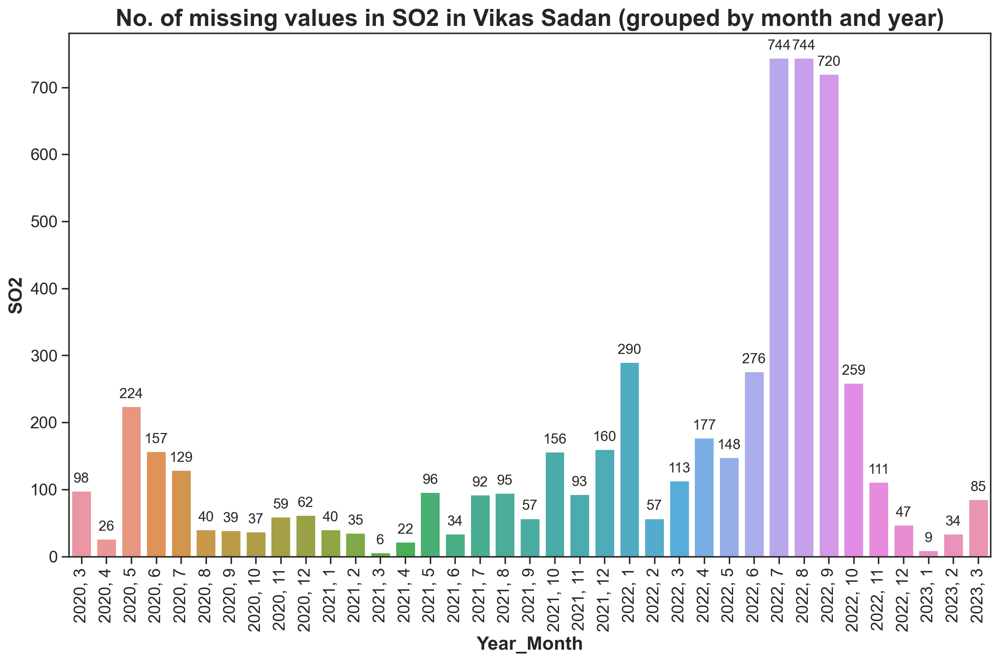

In [79]:
plt.figure(figsize=(14,8))
ax = sns.barplot(data=vikas_sadan_na_so2_count, x="Year_Month", y="SO2")
plt.title("No. of missing values in SO2 in Vikas Sadan (grouped by month and year)")
plt.xlabel("Year_Month")
plt.ylabel("SO2")
ax.set_xticklabels(labels = vikas_sadan_na_so2_count['Year_Month'], rotation=90)

for p in ax.patches:
        ax.annotate(round(p.get_height()),
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center',
                    va='center',
                    fontsize=12,
                    xytext=(0, 10),
                    textcoords='offset points')

In [66]:
fig = px.bar(data_frame=vikas_sadan_na_so2_count, x="Year_Month",y="SO2",text_auto=True,
      title="No. of missing values in SO2 in Vikas Sadan (grouped by month and year)")

fig.update_layout(
    xaxis_title='Year_Month',
    yaxis_title='SO2'
)

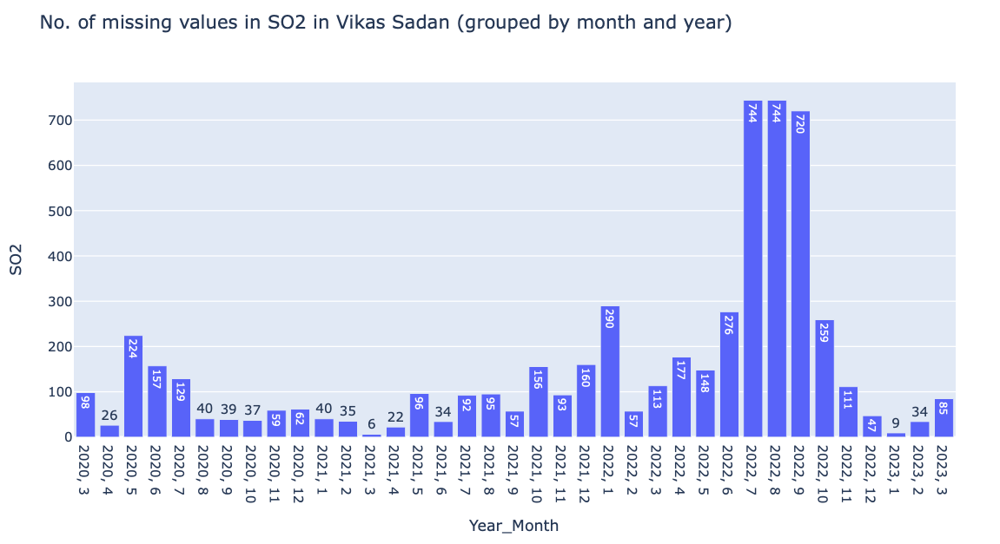

### 2.2.6 Defining helper functions to achieve the same. (Year_Month vs Column Barplot)

In [84]:
from IPython.display import display, HTML

In [94]:
def helper_1(df, col):
    
    """A helper function - Groups by Year and Month to calculate NaNs or None
    Output: Return a DataFrame with Year, Month, Column, Year_Month
    
    Parameters
    ----------
    DataFrame : pandas.core.frame.DataFrame

    col : string
        Column name should be present in the input DataFrame.
    """
    
    df_na = df[df[col].isna()]
    df_na.fillna(1).groupby(by=['Year', "Month"]).count()
    df_na_col_count = df_na.fillna(1).groupby(
        by=['Year', "Month"])[col].count().reset_index()
    df_na_col_count["Year_Month"] = df_na_col_count["Year"].map(
        str) + ", " + df_na_col_count["Month"].map(str)
    return df_na_col_count

In [95]:
def helper_2(df, col):

    """A helper function - Groups by Year, Month & Station to calculate NaNs or None
    Output: Return a DataFrame with Year, Month, Column, Year_Month
    
    Parameters
    ----------
    DataFrame : pandas.core.frame.DataFrame

    col : string
        Column name should be present in the input DataFrame.
    """
    
    df_na = df[df[col].isna()]
    
    df_na.fillna(1).groupby(by=['Year', "Month", "Station"]).count()
    
    df_na_col_count = df_na.fillna(1).groupby(
        by=['Year', "Month", "Station"])[col].count().reset_index()
    
    df_na_col_count["Year_Month"] = df_na_col_count["Year"].map(
        str) + ", " + df_na_col_count["Month"].map(str)

    return df_na_col_count

In [96]:
temp = helper_1(compiled.copy(deep=True), "SO2")
display(temp)

,Year,Month,SO2,Year_Month
0,2015,11,1,"2015, 11"
1,2015,12,372,"2015, 12"
2,2016,1,507,"2016, 1"
3,2016,2,352,"2016, 2"
4,2016,3,464,"2016, 3"
...,...,...,...,...
84,2022,11,974,"2022, 11"
85,2022,12,891,"2022, 12"
86,2023,1,859,"2023, 1"
87,2023,2,806,"2023, 2"


### 2.2.7 No. of missing values in SO2 in all stations (grouped by month and year)

<Figure size 2000x800 with 0 Axes>

Text(0.5, 1.0, 'No. of missing values in SO2 in all stations (grouped by month and year)')

Text(0.5, 0, 'Year_Month')

Text(0, 0.5, 'SO2')

[Text(0, 0, '2015, 11'),
 Text(1, 0, '2015, 12'),
 Text(2, 0, '2016, 1'),
 Text(3, 0, '2016, 2'),
 Text(4, 0, '2016, 3'),
 Text(5, 0, '2016, 4'),
 Text(6, 0, '2016, 5'),
 Text(7, 0, '2016, 6'),
 Text(8, 0, '2016, 7'),
 Text(9, 0, '2016, 8'),
 Text(10, 0, '2016, 9'),
 Text(11, 0, '2016, 10'),
 Text(12, 0, '2016, 11'),
 Text(13, 0, '2016, 12'),
 Text(14, 0, '2017, 1'),
 Text(15, 0, '2017, 2'),
 Text(16, 0, '2017, 3'),
 Text(17, 0, '2017, 4'),
 Text(18, 0, '2017, 5'),
 Text(19, 0, '2017, 6'),
 Text(20, 0, '2017, 7'),
 Text(21, 0, '2017, 8'),
 Text(22, 0, '2017, 9'),
 Text(23, 0, '2017, 10'),
 Text(24, 0, '2017, 11'),
 Text(25, 0, '2017, 12'),
 Text(26, 0, '2018, 1'),
 Text(27, 0, '2018, 2'),
 Text(28, 0, '2018, 3'),
 Text(29, 0, '2018, 4'),
 Text(30, 0, '2018, 5'),
 Text(31, 0, '2018, 6'),
 Text(32, 0, '2018, 7'),
 Text(33, 0, '2018, 8'),
 Text(34, 0, '2018, 9'),
 Text(35, 0, '2018, 10'),
 Text(36, 0, '2018, 11'),
 Text(37, 0, '2018, 12'),
 Text(38, 0, '2019, 1'),
 Text(39, 0, '2019, 2'),

Text(0, 10, '1')

Text(0, 10, '372')

Text(0, 10, '507')

Text(0, 10, '352')

Text(0, 10, '464')

Text(0, 10, '81')

Text(0, 10, '41')

Text(0, 10, '144')

Text(0, 10, '118')

Text(0, 10, '280')

Text(0, 10, '233')

Text(0, 10, '216')

Text(0, 10, '123')

Text(0, 10, '138')

Text(0, 10, '117')

Text(0, 10, '101')

Text(0, 10, '64')

Text(0, 10, '27')

Text(0, 10, '242')

Text(0, 10, '93')

Text(0, 10, '23')

Text(0, 10, '67')

Text(0, 10, '22')

Text(0, 10, '78')

Text(0, 10, '314')

Text(0, 10, '35')

Text(0, 10, '66')

Text(0, 10, '363')

Text(0, 10, '738')

Text(0, 10, '717')

Text(0, 10, '700')

Text(0, 10, '334')

Text(0, 10, '1')

Text(0, 10, '9')

Text(0, 10, '171')

Text(0, 10, '90')

Text(0, 10, '21')

Text(0, 10, '69')

Text(0, 10, '67')

Text(0, 10, '164')

Text(0, 10, '70')

Text(0, 10, '92')

Text(0, 10, '96')

Text(0, 10, '180')

Text(0, 10, '21')

Text(0, 10, '142')

Text(0, 10, '45')

Text(0, 10, '40')

Text(0, 10, '42')

Text(0, 10, '34')

Text(0, 10, '41')

Text(0, 10, '79')

Text(0, 10, '852')

Text(0, 10, '748')

Text(0, 10, '1009')

Text(0, 10, '987')

Text(0, 10, '966')

Text(0, 10, '844')

Text(0, 10, '795')

Text(0, 10, '853')

Text(0, 10, '843')

Text(0, 10, '868')

Text(0, 10, '860')

Text(0, 10, '776')

Text(0, 10, '770')

Text(0, 10, '752')

Text(0, 10, '853')

Text(0, 10, '774')

Text(0, 10, '852')

Text(0, 10, '874')

Text(0, 10, '791')

Text(0, 10, '910')

Text(0, 10, '827')

Text(0, 10, '935')

Text(0, 10, '1049')

Text(0, 10, '815')

Text(0, 10, '932')

Text(0, 10, '1028')

Text(0, 10, '1077')

Text(0, 10, '1197')

Text(0, 10, '1806')

Text(0, 10, '1732')

Text(0, 10, '1532')

Text(0, 10, '1122')

Text(0, 10, '974')

Text(0, 10, '891')

Text(0, 10, '859')

Text(0, 10, '806')

Text(0, 10, '792')

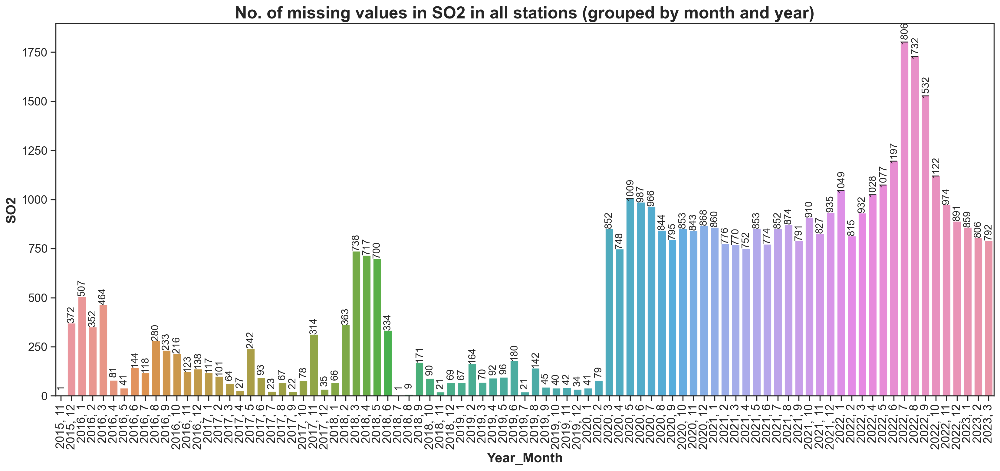

In [99]:
plt.figure(figsize=(20,8))
ax = sns.barplot(data=temp, x="Year_Month", y="SO2")
plt.title("No. of missing values in SO2 in all stations (grouped by month and year)")
plt.xlabel("Year_Month")
plt.ylabel("SO2")
ax.set_xticklabels(labels = temp['Year_Month'], rotation=90)

for p in ax.patches:
        ax.annotate(round(p.get_height()),
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center',
                    va='center',
                    fontsize=12,
                    xytext=(0, 10),
                    rotation=90,
                    textcoords='offset points')

In [100]:
px.bar(data_frame = temp,
       x = "Year_Month",
       y="SO2",
       text_auto=True,
       title="No. of missing values in SO2 in all stations (grouped by month and year)"
       )

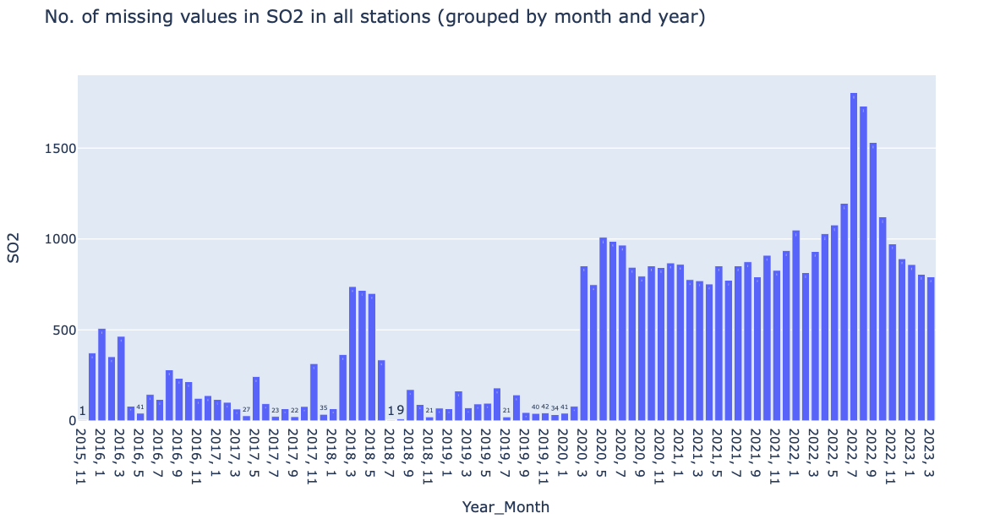

In [106]:
compiled.groupby(['Year','Month','Station'])['SO2'].count().reset_index()

,Year,Month,Station,SO2
0,2015,11,No Station,80
1,2015,12,No Station,372
2,2016,1,No Station,237
3,2016,2,No Station,344
4,2016,3,No Station,280
...,...,...,...,...
200,2023,2,Vikas Sadan,638
201,2023,3,NISE,0
202,2023,3,Sector 51,608
203,2023,3,Teri Gram,518


In [108]:
# Not missing values.

px.bar(data_frame = compiled.groupby(['Year','Month','Station'])['SO2'].count().reset_index(),
       x = "Year",
       y="SO2",
       color="Station",
       text_auto=True,
       title="SO2 count distribution"
       )

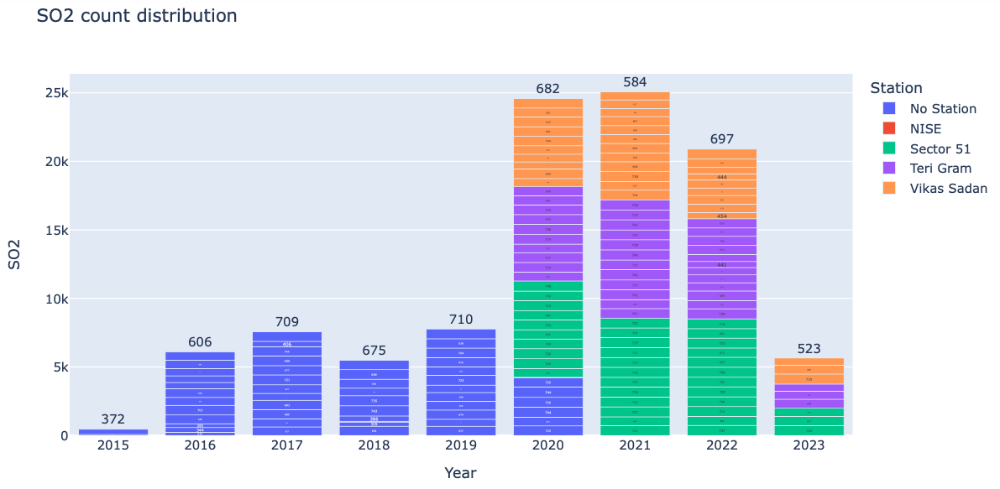

In [109]:
so2_year_month_station = compiled.groupby(['Year','Month','Station'])['SO2'].count().reset_index()
so2_year_month_station

# These are not missing values

,Year,Month,Station,SO2
0,2015,11,No Station,80
1,2015,12,No Station,372
2,2016,1,No Station,237
3,2016,2,No Station,344
4,2016,3,No Station,280
...,...,...,...,...
200,2023,2,Vikas Sadan,638
201,2023,3,NISE,0
202,2023,3,Sector 51,608
203,2023,3,Teri Gram,518


In [114]:
col = "SO2"
px.bar(data_frame = helper_2(compiled.copy(deep=True), col),
       x = "Year_Month",
       y = col,
       color="Station",
       text_auto = True,
       title = "No. of missing values in "+ col
       )

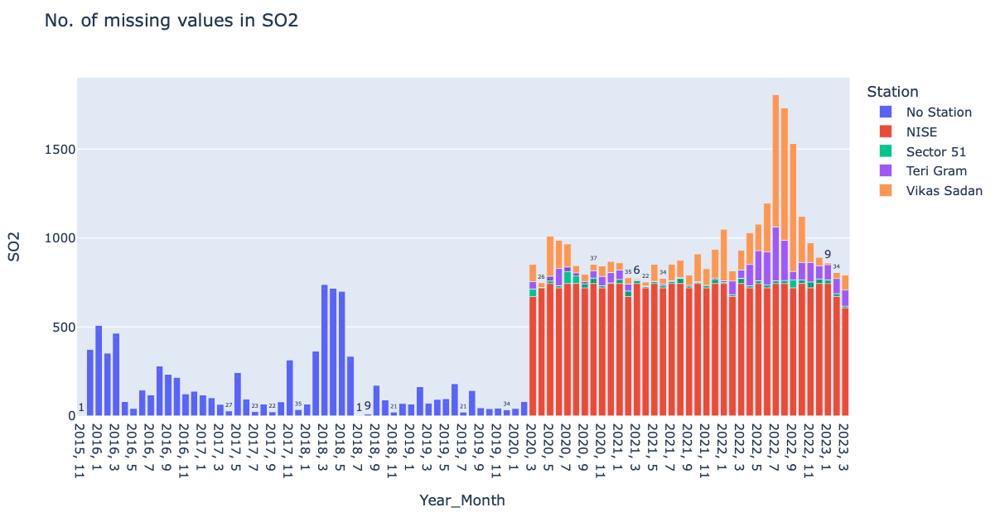

### 2.2.8 Plotting all the columns - Missing values barplot

In [123]:
def plot_missing_values(df, col):
    temp_df_plot = helper_2(df.copy(deep=True), col)
    ax = temp_df_plot.groupby(['Year_Month', 'Station'])[col].sum().unstack().plot(kind='bar', stacked=True, figsize=(16, 5), color=custom_colors)
    plt.xlabel('Year_Month')
    plt.ylabel(col)
    plt.title(f'Number of missing values in {col} month wise - Stacked by Station')

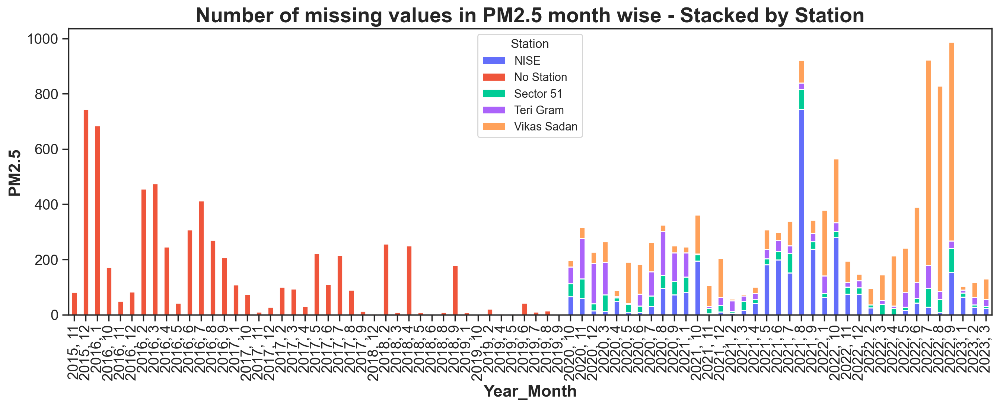

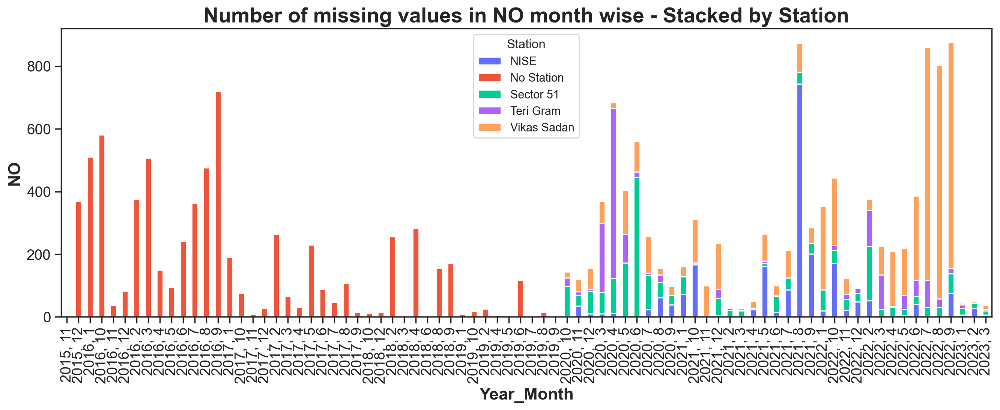

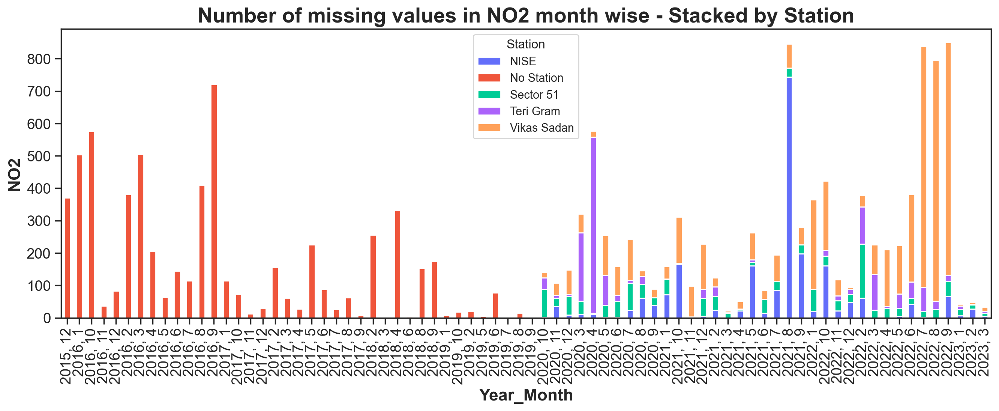

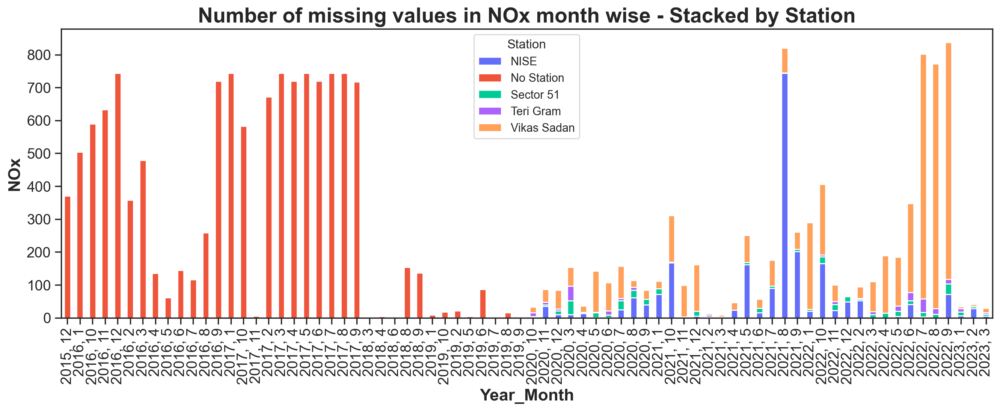

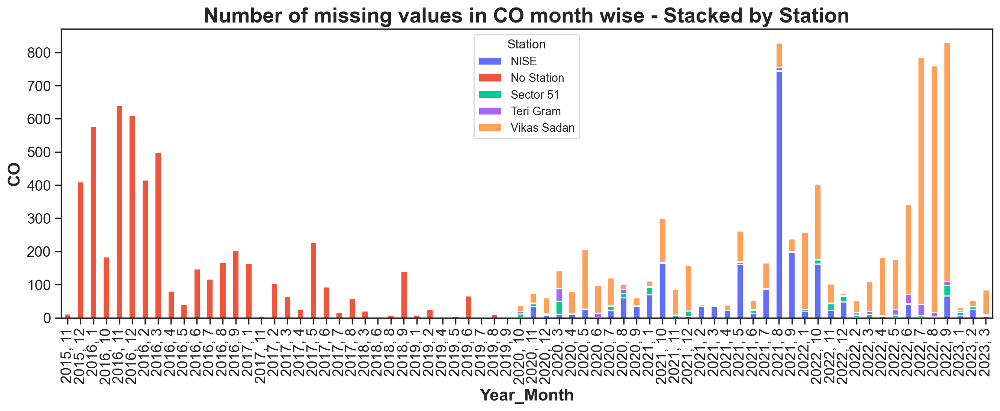

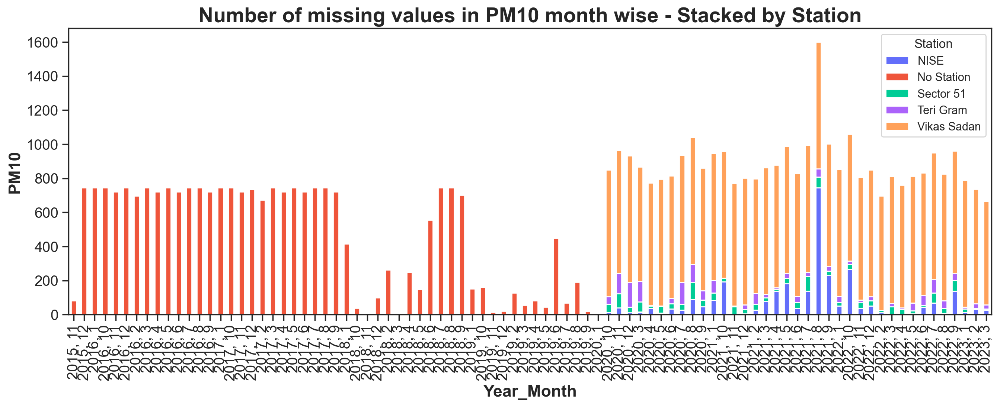

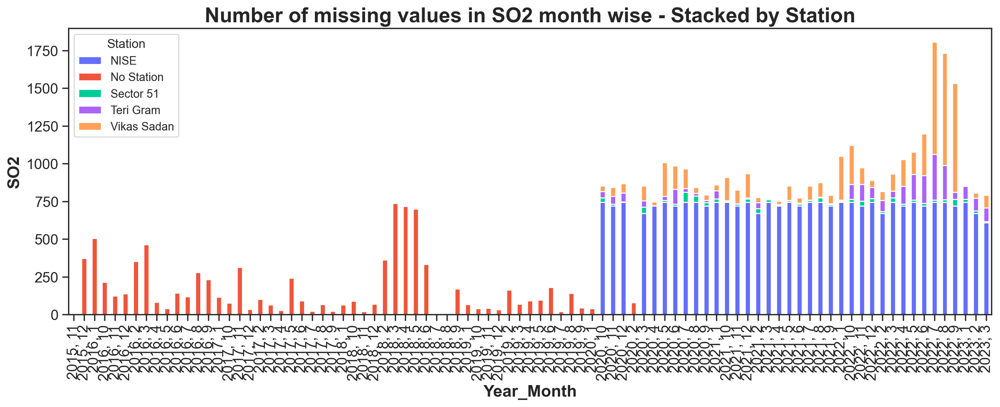

In [124]:
for col in ["PM2.5", "NO", "NO2", "NOx", "CO", "PM10", "SO2"]:
    plot_missing_values(compiled, col)

In [125]:
# Same with Plotly

for col in ["PM2.5", "NO", "NO2", "NOx", "CO", "PM10", "SO2"]:
    px.bar(data_frame = helper_2(compiled.copy(deep=True), col),
           x = "Year_Month",
           y = col,
           color="Station",
           text_auto = True,
           title = "No. of missing values in "+ col + "month wise - Stacked by Station"
           )

In [80]:
# sns.lineplot(data = vikas_sadan[vikas_sadan['SO2'].isna()], x="Datetime", y="SO2")
# Since there are only NaNs it is keyError, there is nothing to plot.

In [127]:
# Since this is a time series data, use ffill, bfill, linear interpolation for filling NAs
compiled['Datetime'][:107273] # From 2020 March
compiled['Datetime'][107273:] # From 2015

0        2020-03-04 00:00:00
1        2020-03-04 01:00:00
2        2020-03-04 02:00:00
3        2020-03-04 03:00:00
4        2020-03-04 04:00:00
                 ...        
107268   2023-03-26 03:00:00
107269   2023-03-26 04:00:00
107270   2023-03-26 05:00:00
107271   2023-03-26 06:00:00
107272   2023-03-26 07:00:00
Name: Datetime, Length: 107273, dtype: datetime64[ns]

107273   2015-11-27 15:00:00
107274   2015-11-27 16:00:00
107275   2015-11-27 17:00:00
107276   2015-11-27 18:00:00
107277   2015-11-27 19:00:00
                 ...        
147526   2020-06-30 20:00:00
147527   2020-06-30 21:00:00
147528   2020-06-30 22:00:00
147529   2020-06-30 23:00:00
147530   2020-07-01 00:00:00
Name: Datetime, Length: 40258, dtype: datetime64[ns]

### 2.2.9 SO2 distribution over the years

<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='SO2'>

Text(0.5, 1.0, 'SO2 from 2020 March to 2023 March')

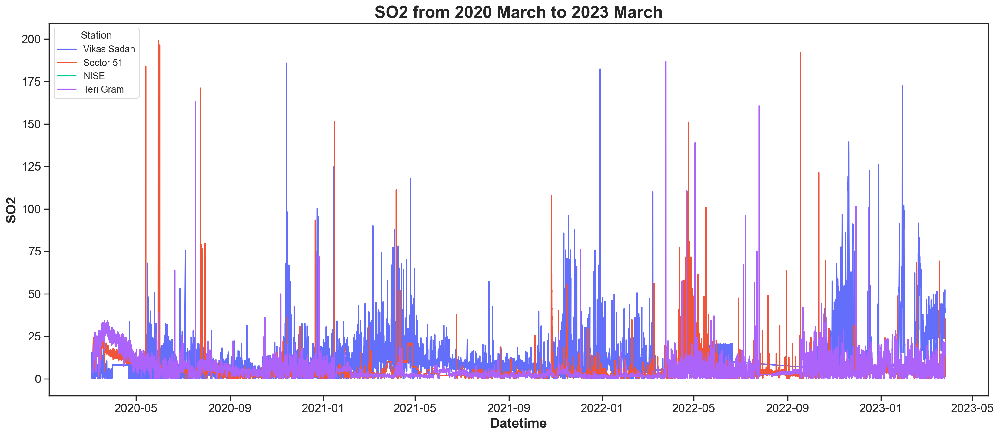

In [129]:
plt.figure(figsize=(20,8))
sns.lineplot(data=compiled[:107273], x="Datetime", y="SO2", hue="Station")
plt.title("SO2 from 2020 March to 2023 March")

<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='SO2'>

Text(0.5, 1.0, 'SO2 from 2015 to 2020 March')

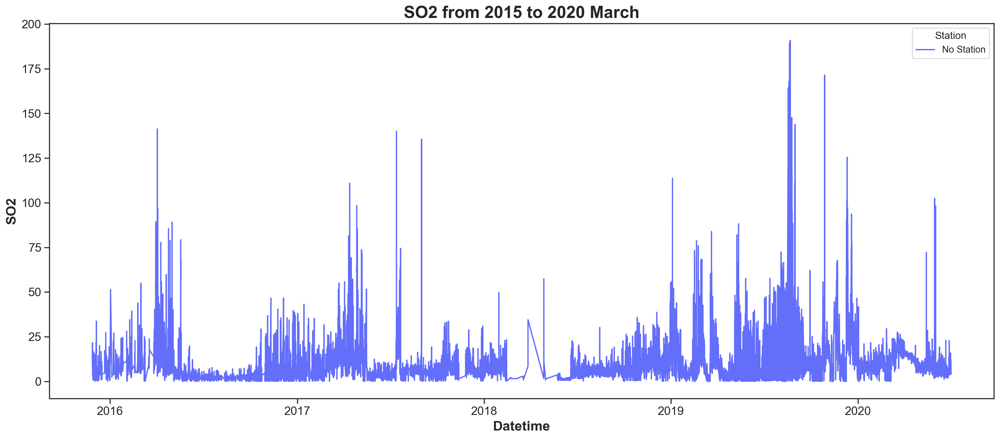

In [130]:
plt.figure(figsize=(20,8))
sns.lineplot(data=compiled[107273:], x="Datetime", y="SO2", hue="Station")
plt.title("SO2 from 2015 to 2020 March")

<AxesSubplot: title={'center': 'SO2'}, xlabel='[Station]'>

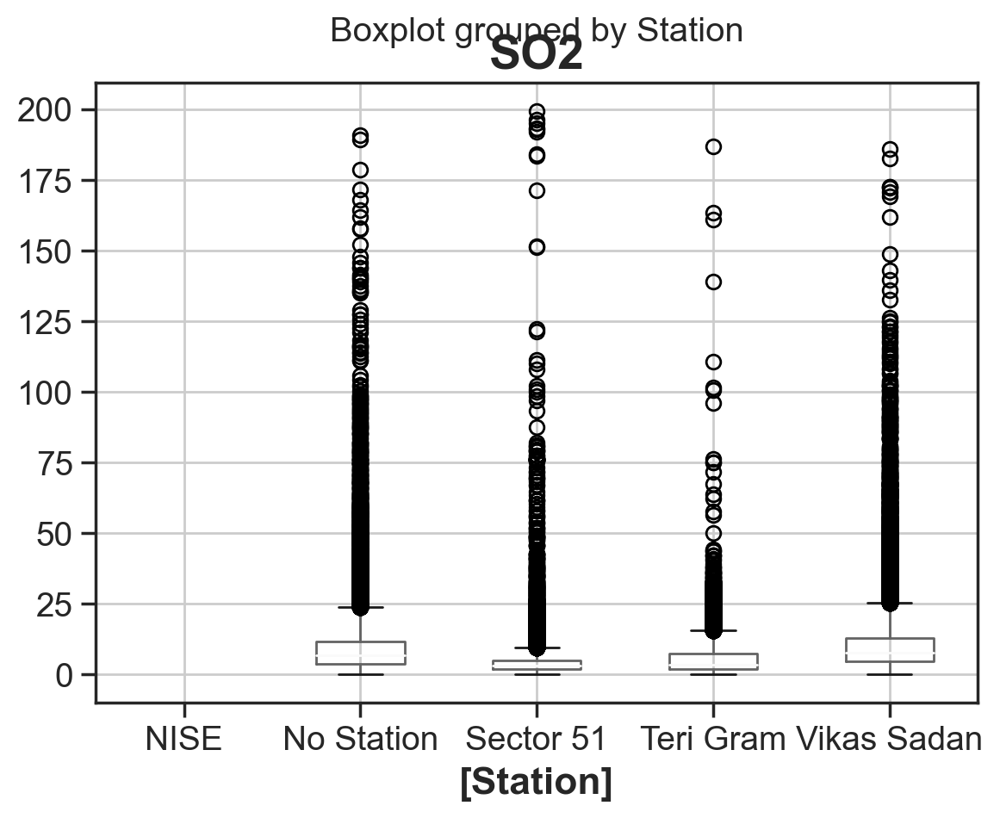

In [131]:
compiled.boxplot(column='SO2', by=['Station'])

In [90]:
# Missing values by station

compiled.groupby(['Station']).apply(lambda x : ((x.isnull().sum() + (x=="None").sum())/compiled.shape[0])*100 ).T

Station,NISE,No Station,Sector 51,Teri Gram,Vikas Sadan
Datetime,0.000000,0.000000,0.000000,0.000000,0.000000
Station,0.000000,0.000000,0.000000,0.000000,0.000000
PM2.5,2.139211,4.164548,0.825589,1.153656,3.414198
NO,1.452576,4.572598,1.450543,1.026903,3.320658
NO2,1.451898,4.104222,0.886593,1.033003,3.313880
NOx,1.449187,8.609716,0.288075,0.182335,3.240675
SO2,18.176519,5.859785,0.496845,1.512225,3.776156
CO,1.455965,3.499603,0.210803,0.157933,3.286767
Ozone,1.411907,27.287824,0.487355,0.452108,3.980180
Benzene,18.176519,8.596837,7.460805,0.289431,3.105110


In [134]:
px.bar(compiled.groupby(['Station']).apply(lambda x : round(((x.isnull().sum() + (x=="None").sum())/compiled.shape[0])*100, 2) ).T, text_auto=True)

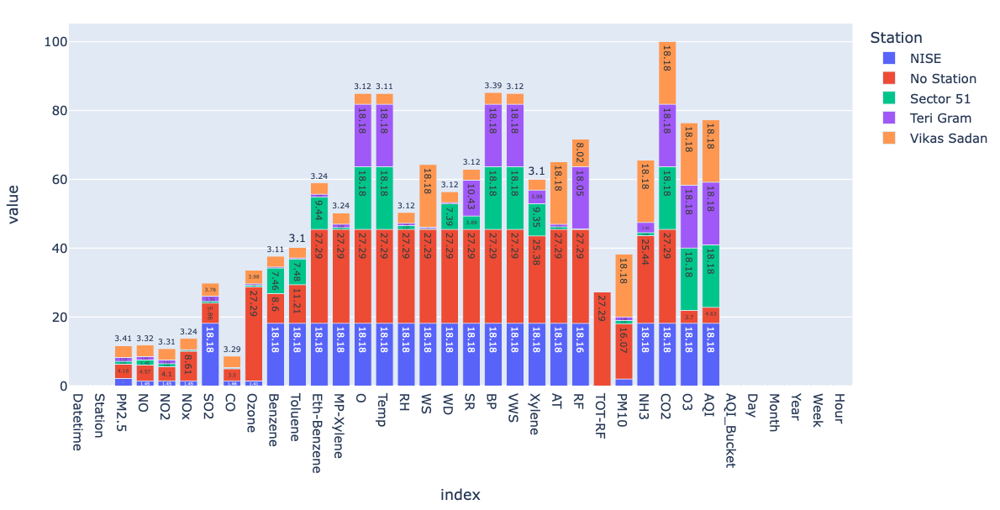

In [93]:
# compiled.to_csv('../../data/preprocessing_data/compiled_part_1_end.csv')

# End of part 1